In [ ]:
# Reference: Tutorial: Creating Your First QA Pipeline with Retrieval-Augmentation
# https://haystack.deepset.ai/tutorials/27_first_rag_pipeline

In [ ]:
%%bash

pip install haystack-ai
pip install "datasets>=2.6.1"
pip install "sentence-transformers>=2.2.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.1/265.1 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.5/257.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━

In [ ]:
from haystack.document_stores.in_memory import InMemoryDocumentStore

document_store = InMemoryDocumentStore()

In [ ]:
from haystack import Document
import os
from google.colab import drive
drive.mount('/content/drive')
doc_dir = '/content/drive/My Drive/NLP2/reference'

# Initialize a list to hold your documents
documents = []

# Loop through each file in your documents directory
for filename in os.listdir(doc_dir):
    if filename.endswith(".txt"):  # Make sure to process only text files
        file_path = os.path.join(doc_dir, filename)
        with open(file_path, 'r', encoding='utf-8') as file:
            text = file.read()
            # Add the document to the list, assuming each file is a separate document
            documents.append({'content': text, 'meta': {'name': filename}})
docs = [Document(content=doc["content"], meta=doc["meta"]) for doc in documents]

Mounted at /content/drive


In [ ]:
from haystack.components.embedders import SentenceTransformersDocumentEmbedder

doc_embedder = SentenceTransformersDocumentEmbedder(model="sentence-transformers/all-MiniLM-L6-v2")
doc_embedder.warm_up()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
docs_with_embeddings = doc_embedder.run(docs)
document_store.write_documents(docs_with_embeddings["documents"])

Batches:   0%|          | 0/17 [00:00<?, ?it/s]

528

## Building the RAG Pipeline


### Initialize a Text Embedder

In [ ]:
from haystack.components.embedders import SentenceTransformersTextEmbedder

text_embedder = SentenceTransformersTextEmbedder(model="sentence-transformers/all-MiniLM-L6-v2")

### Initialize the Retriever

In [ ]:
from haystack.components.retrievers.in_memory import InMemoryEmbeddingRetriever

retriever = InMemoryEmbeddingRetriever(document_store)

In [ ]:
from haystack.components.builders import PromptBuilder

template = """
Given the following information, answer the question.

Context:
{% for document in documents %}
    {{ document.content }}
{% endfor %}

Question: {{question}}
Answer:
"""

prompt_builder = PromptBuilder(template=template)

In [ ]:
# import os
# from getpass import getpass
# from haystack.components.generators import OpenAIGenerator

from haystack import component
from transformers import T5ForConditionalGeneration, T5Tokenizer
from typing import List

@component
class T5Generator:
    def __init__(self, model, tokenizer, max_length=512):
        self.model = model
        self.tokenizer = tokenizer
        self.max_length = max_length

    def run(self, prompt: str):
        input_ids = self.tokenizer.encode(prompt, return_tensors="pt", max_length=self.max_length, truncation=True)
        outputs = self.model.generate(input_ids, max_length=self.max_length, num_beams=5, early_stopping=True)
        answer = self.tokenizer.decode(outputs[0], skip_special_tokens=True)
        return {"answer": answer}

# Initialize the T5 model and tokenizer
model_name = "t5-small"
model = T5ForConditionalGeneration.from_pretrained(model_name)
tokenizer = T5Tokenizer.from_pretrained(model_name)

# Instantiate the T5 generator
t5_generator = T5Generator(model, tokenizer)


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


### Build the Pipeline

Create connections from `text_embedder`'s "embedding" output to "query_embedding" input of `retriever`, from `retriever` to `prompt_builder` and from `prompt_builder` to `generator`.

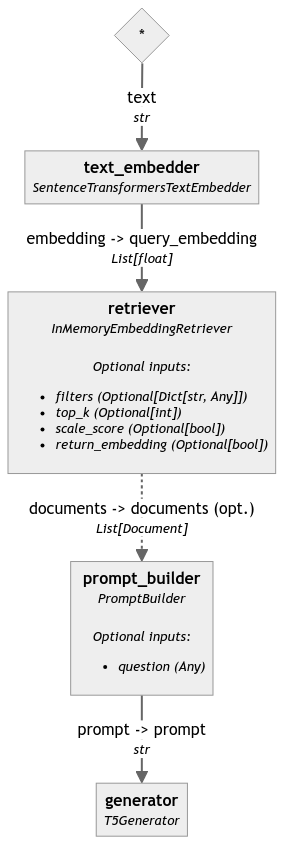

In [ ]:
from haystack import Pipeline

# Create a new Haystack pipeline
rag_pipeline = Pipeline()

# Add components to the new pipeline. Make sure these are new instances if they were used elsewhere.
rag_pipeline.add_component("text_embedder", text_embedder)
rag_pipeline.add_component("retriever", retriever)
rag_pipeline.add_component("prompt_builder", prompt_builder)
rag_pipeline.add_component("generator", t5_generator)

# Now, connect the components within the new pipeline
rag_pipeline.connect("text_embedder.embedding", "retriever.query_embedding")
rag_pipeline.connect("retriever", "prompt_builder.documents")
rag_pipeline.connect("prompt_builder.prompt", "generator.prompt")

## Asking a Question

When asking a question, use the `run()` method of the pipeline.

In [ ]:
# Define the question you want to ask
question = "In what year was Carnegie Mellon University founded?"

# Execute the pipeline with the specified question
response = rag_pipeline.run({"text_embedder": {"text": question}, "prompt_builder": {"question": question}})

# Print out the answer
print(response["generator"]["answer"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


In [ ]:
import os

# Path to the question file
question_file = '/content/drive/My Drive/NLP2/FAQ_style_QA/Q_Train/NLP2_Q_traning_all.txt'

# Path to save the answer file
answer_file = '/content/drive/My Drive/NLP2/model_answer/t5_answer.txt'

# Read the questions from the file
with open(question_file, 'r') as f:
    questions = f.read().splitlines()

# List to store the answers
answers = []

# Iterate over the questions and get the answers
for question in questions:
    # Execute the pipeline with the specified question
    response = rag_pipeline.run({"text_embedder": {"text": question}, "prompt_builder": {"question": question}})
    answer = response["generator"]["answer"]
    answers.append(answer)
    print(answer)

# Save the answers to a file
with open(answer_file, 'w') as f:
    f.write('\n'.join(answers))

print(f"Answers saved to {answer_file}")

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a study aimed to synthesize the empirical research on learning analyt - ics in virtual labs by conducting a systematic review. We reviewed 21 articles that were published between 2015 and 2021. 48% of studies were conducted in higher education, with the main focus on the medical field.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

eISSN 2302 -4240 eISSN 2655 -2086 Volume 12, Issue 1, February 2023, pp.0 63-076 DOI: http://dx.doi.org/10.32832/astonjadro.v12i1 Answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:(0123456789)h ttps://doi.org/10.1007/s11412-023-09389-x 1 3 Editorial: Nine elements for robust collaborative learning analytics: A constructive collaborative critique Alyssa Friend Wise1  Carolyn Rosé2  Sanna Järvelä3  International Society of the Learning Sciences, Inc. 2023 Introduction This editorial represents a collaborative effort between the current co-editors-in-chief of the


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:(0123456789)1 3Academic Psychiatry (2023) 47:309–313 https://doi.org/10.1007/s40596-023-01794-6 'DOWN TO EARTH' ACADEMIC SKILLS COLUMN Recommendations for Implementing, Leading, and Participating in Process Groups During Training in Psychiatry Seamus BhattMackin1  Meenakshi Denduluri2 Receive


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Frontiers in Psychology 01 frontiersin.org Sustainability pedagogy: Understanding, exploring and internalizing nature’s complexity and coherence Nicole Spiegelaar * Trinity College and School of the Environment, University of Toronto, Toronto, ON, Canada.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, ML-SUPERB 1. Context: FINDINGS OF THE 2023 ML-SUPERB CHALLENGE: PRE-TRAINING AND EV ALUATION OVER MORE LANGUAGES AND BEYOND Jiatong Shi1, William Chen1, Dan Berrebbi1, Hsiu-Hsuan Wang2, Wei-Ping Huang2, En-Pei Hu2, Ho-Lam Chuang2, Xuankai Chang1, Yuxun Tang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we build an environment for language-guided agents that is highly realistic and reproducible. In this paper, we build an environment for language-guided agents that is highly realistic and reproducible. Specifically, we focus on agents that perform tasks on the web, and create an environment with fully functional websites.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

— Language Models are Good Teachers for Embodied Agents. Figure 1. PET framework. Plan, Eliminate, and Track — Language Models are Good Teachers for Embodied Agents.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Open-World Object Manipulation using Pre-Trained Vision-Language Models Austin Stone, Ted Xiao, Yao Lu, Keerthana Gopalakrishnan, Kuang-Huei Lee, Quan Vuong, Paul Wohlhart, Sean Kirmani, Sean Kirmani, Brianna Zitkovich, Fei Xia, Chelsea Finn, Karol Hausman Google DeepMind Abstract


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SPAE: Semantic Pyramid AutoEncoder (SPAE) for Multimodal Generation with Frozen LLMs Lijun YuYong ChengZhiruo WangVivek KumarWolfgang Macherey Yanping HuangDavid A. RossIrfan EssaYonatan BiskMing-Hsuan Yang Kevin MurphyAlexander G. HauptmannLu Jiang Google,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: AutoAD: Movie Description in Context Tengda Han1Max Bain1Arsha Nagrani1G ul Varol1,2Weidi Xie1,3Andrew Zisserman1 1Visual Geometry Group, University of Oxford 2LIGM, Ecole des Ponts, Univ Gustave Eiffel, CNRS3CMIC, Shanghai Jiao Tong University


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SynthCap: Augmenting Transformers with Synthetic Data for Image Captioning Davide Caffagni1[0009000232796480], Manuele Barraco, Manuele; Cornia, Marcella; Baraldi, Lorenzo; Cucchiara, Rita.- 14233:(2023), pp. 112-123.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Frontiers in Psychology 01 frontiersin.org Sustainability pedagogy: Understanding, exploring and internalizing nature’s complexity and coherence Nicole Spiegelaar * Trinity College and School of the Environment, University of Toronto, Toronto, ON, Canada.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ECAs are advanced human-lik e interf aces that engage users in natural face-to-face conversations and interactions. These traits position ECAs as innovative tools for delivering MI interv entions for promoting health-related behavior adoption. These traits position ECAs as innovative tools for delivering MI interv entions for promoting health-related behavior adoption.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Object Goal Navigation (OGN)[1]–[3] have enhanced the proficiency of robotic agents in navigating indoor environments by leveraging spatial and semantic cues. Agents that can guide humans (e.g. the visually impaired [4]) are an important enabling technology.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Object Goal Navigation (OGN)[1]–[3] have enhanced the proficiency of robotic agents in navigating indoor environments by leveraging spatial and semantic cues. Agents that can guide humans (e.g. the visually impaired [4]) are an important enabling technology.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SLAP uses three-dimensional tokens as input representation to train a single multi-task, language-conditioned action prediction policy. SLAP uses three-dimensional tokens as the input representation to train a single multi-task, language-conditioned action prediction policy. SLAP uses three-dimensional tokens as the input representation to train a single multi-task, language-conditioned action prediction policy.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:(0123456789)1 3KI - Künstliche Intelligenz (2023) 37:5–9 https://doi.org/10.1007/s13218-022-00797-z EDITORIAL GeoAI Simon Scheider1  KaiFlorian Richter2 Published online: 20 January 2023  The Author(s), under exclusive licence to Springer-Verlag GmbH Germany and Gesellschaft für Informatik e.V. 2023 Research in artificial intelligence


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,7Alexey Zozulya,7Roman Shayduk,8Anders Madsen,7Nicusor Timneanu,6 Carl Caleman,1, 91058 Erlangen, Germany 4Department of Physics, Friedrich-Alexander-Universit  at Erlangen-N  urnberg, Staudtstr. 1, 91058 Erlangen, Germany 5Erlangen Graduate School in Advanced Optical Technologies (SAOT), Friedrich-Alexander Universit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: An insight into brown/beige adipose tissue whitening, a metabolic complication of obesity that is linked to multiple factors. Context: An insight into brown/beige adipose tissue whitening, a metabolic complication of obesity with themultifactorial origin Khanyisani Ziqubu1, Phiwayinkosi V. Dludla2,3, Sinenhlanhla X. H. Mthembu1,2, Bongan


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.edu.cn Shanghai Jiao Tong University Shanghai, ChinaWeiwen Liu liuweiwen8@huawei.com Huawei Noah’s Ark Lab Shenzhen, ChinaJianghao Lin chiangel@sjtu.edu.cn Shanghai Jiao Tong University Shanghai, China ABSTRACT Recommender systems play a vital role in various online services. However, the insulated nature of training and deploying


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Medical Report Generation and Chatbot for COVID_19 diagnosis Using Open-AI Fozia Mehboob Knightec AB, Khalid Mahmood Malik Oakland University Rochester Abdul Khader Jilani Saudagar (  aksaudagar@imamu.edu.sa ) Article Keywords: Text Report Generation and Chatbot for COVID_19 diagnosis, Deep learning, CT scan, Open AI, Segmentation Posted Date: March 27th,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Bauer, Michael D.; Huber, Daniel; Rudebusch, Glenn D.; Wilms, Ole (2023) : Where Is the Carbon Premium? Context: Bauer, Michael D.; Huber, Daniel; Rudebusch, Glenn D.; Wilms, Ole (2023) : Where Is the Carbon Premium? Global Performance of Green and Brown Stocks CESifo Working Paper, No. 10246, Center for Economic Studies and if


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

520, 2081–2093 (2023) https://doi.org/10.1093/mnras/stad188 Advance Access publication 2023 January 18 Answer the question: MNRAS 520, 2081–2093 (2023)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

of Transfer Learning and Established Calibration Transfer Methods for Metal Oxide Semiconductor Gas Sensors Yannick Robin *, Johannes Amann, Tizian Schneider, Andreas Schütze and Christian Bur Lab for Measurement Technology, Saarland University, Campus A5 1, 66123 Saarbrücken, Germany; j.amann@lmt.uni-saarland.de (J.A.); t.schneider@lmt.uni-sa


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Generate-then-Retrieve: Intent-Aware FAQ Retrieval in Product Search Zhiyu Chen Jason Choi Besnik Fetahu Oleg Rokhlenko Shervin Malmasi Amazon.com, Inc. Seattle, WA, USA zhiyuche,chojson,besnikf,olegro,malmasi@amazon.com Abstract Customers are increasingly formulating information- seeking queries.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

MT to translate Spanish into 10 indigenous languages, including Ashaninka, Aymara, Bribri, Guarani, Hähu, Nahuatl, Quechua, Raramuri, Shipibo- Konibo, and Wixarika.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Q: Wh a t’ s in t he im a g e? A: F ir s t gr a s p b lu e b l ock? A: F ir s t gr a s p b lu e l ock? A: F ir s t gr a s p b lu e l ock?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Data61 and Monash UniversityIan Yu PIISAPaulo Villegas Telefonica I+D Marco Zocca Unfold MLSourab Mangrulkar Hugging FaceDavid Lansky Independent Huu Nguyen Ontocord, LLCDanish Contractor IndependentLuis Villa Independent Jia Li IndependentDzmitry Bahdanau ServiceNow ResearchDenis Kocetkov* ServiceNow Research Chenghao Mou IndependentChristopher Akiki ScaDS.AI Leipzig and C4AI CommunityCar


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

– a single demonstration, our global ranking method exactly replicates RSA’s ranked responses. This work presents a novel method of amortizing the RSA algorithm by leveraging a global ranking – a single, total ordering of all the hypotheses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

MT to translate Spanish into 10 indigenous languages, including Ashaninka, Aymara, Bribri, Guarani, Hähu, Nahuatl, Quechua, Raramuri, Shipibo- Konibo, and Wixarika.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Do All Languages Cost the Same? Context: Do All Languages Cost the Same? Tokenization in the Era of Commercial Language Models Orevaoghene AhiaSachin KumarHila GonenJungo Kasai David R. MortensenNoah A. SmithYulia Tsvetkov Paul G. Allen School of Computer Science & Engineering.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

MT to translate Spanish into 10 indigenous languages, including Ashaninka, Aymara, Bribri, Guarani, Hähu, Nahuatl, Quechua, Raramuri, Shipibo- Konibo, and Wixarika.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Do All Languages Cost the Same? Context: Do All Languages Cost the Same? Tokenization in the Era of Commercial Language Models Orevaoghene AhiaSachin KumarHila GonenJungo Kasai David R. MortensenNoah A. SmithYulia Tsvetkov Paul G. Allen School of Computer Science & Engineering.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a study aimed to synthesize the empirical research on learning analyt - ics in virtual labs by conducting a systematic review. We reviewed 21 articles that were published between 2015 and 2021. 48% of studies were conducted in higher education, with the main focus on the medical field.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Frontiers in Psychology 01 frontiersin.org Sustainability pedagogy: Understanding, exploring and internalizing nature’s complexity and coherence Nicole Spiegelaar * Trinity College and School of the Environment, University of Toronto, Toronto, ON, Canada.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, YR Media, lissa.soep@yrmedia.org Duri Long, Carnegie Mellon University, aeo@andrew.cmu.edu Elisabeth Soep, Concord Consortium, jchao@concord.org Carolyn P. Rosé, Carnegie Mellon University, cp3a@andrew.cmu.edu Sepehr Vakil, Northwestern University


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Ilaria Working Paper Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Il


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in peer-tutoring conversations. We used a multimodal peer-tutoring dataset to construct a computational framework for hedges. Identifying Hedges in peer-tutoring interactions Yann Raphalen1, Chloé Clavel2, Justine Cassell1,3 1Inria Paris 2LTCI, Institut Polytechnique de Paris, Telecom-Paris 3Carnegie Mellon University.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Medical Report Generation and Chatbot for COVID_19 diagnosis Using Open-AI Fozia Mehboob Knightec AB, Khalid Mahmood Malik Oakland University Rochester Abdul Khader Jilani Saudagar (  aksaudagar@imamu.edu.sa ) Article Keywords: Text Report Generation and Chatbot for COVID_19 diagnosis, Deep learning, CT scan, Open AI, Segmentation Posted Date: March 27th,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 316AI Consent Futures: A Case Study on Voice Data Collection with Clinicians LAUREN WILCOX, Google Research, USA ROBIN BREWER,Google Research, USA FERNANDO DIAZ, Google Research, USA. In this paper, we present clinicians’ perspectives on the prospective benefits and harms of voice data collection during health consultations.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

of lexical alignment in human understanding of explanations by conversational agents Sumit Srivastava s.srivastava-1@utwente.nl University of Twente Enschede, NetherlandsMarit Theune m.theune@utwente.nl University of Twente Enschede, NetherlandsAlejandro Catala alejandro.catala@usc.es Centro Singular de Investigación en Tecnolox


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ECAs are advanced human-lik e interf aces that engage users in natural face-to-face conversations and interactions. These traits position ECAs as innovative tools for delivering MI interv entions for promoting health-related behavior adoption. These traits position ECAs as innovative tools for delivering MI interv entions for promoting health-related behavior adoption.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

The Multimodal Information Based Speech Processing (Misp) 2022 Challenge Audio-Visual Diarization And Recognition Wang, Zhe; Wu, Shilong ; Chen, Hang ; He, Mao-Kui ; Du, Jun ; Lee, Chin-Hui ; Chen, Jingdong ; Watanabe, Shinji ; Siniscalchi, Sabato Marco ; Scharenborg, O., Liu, D., & More Authors


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Q: Wh a t’ s in t he im a g e? A: F ir s t gr a s p b lu e b l ock? A: F ir s t gr a s p b lu e l ock? A: F ir s t gr a s p b lu e l ock?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on pre-trained ASR models Santosh Kesiraju1, Marek Sarva s1, Tom as Pavli cek2, C ecile Macaire3, Alejandro Ciuba4 1Speech@FIT, Brno University of Technology, Czechia.2Phonexia, Czechia.3Univ. Grenoble Alpes, France.4University of Pittsburgh, USA.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, a - grated an AI performance prediction model with learning analytics approaches to improve student learning. Quasi- experimental research was conducted in an online engineering course to examine the differences of students’ collaborative learning effect with and without the support of the integrated approach.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, Cyber Security, OSINT investigation, cy- bersecurity training Abstract Open-source intelligence (OSINT) is an intelligence discipline that synthesizes information from publicly available sources and analyzes it. Open-source intelligence (OSINT) is an intelligence discipline that synthesizes information from publicly available sources and analyzes it.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, - ture high-quality, well-characterized data that comprehensively represent the target popula tion1,2. Precision health provides an important opportunity for reducing health disparities among minor - itized racial or ethnic groups, or those who are under-resourced.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-lactamase,yang89@ucsb.edu,leili@cs.cmu.edu,leili@cs.cmu.edu yunlongz,wxsh@mit.edu ABSTRACT Proteins are crucial macromolecules in almost all living organisms.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.edu.cn Shanghai Jiao Tong University Shanghai, ChinaWeiwen Liu liuweiwen8@huawei.com Huawei Noah’s Ark Lab Shenzhen, ChinaJianghao Lin chiangel@sjtu.edu.cn Shanghai Jiao Tong University Shanghai, China ABSTRACT Recommender systems play a vital role in various online services. However, the insulated nature of training and deploying


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we present an extension to the event grounding task that re- quires tackling hierarchical event structures from the KB. event grounding aims at linking mention references in text corpora to events from a knowledge base (KB) previous work on this task focused primarily on linking to a single KB event, thereby overlooking the hierarchical aspects of eve nts.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CSCL 2023 Proceedings  ISLS 378 Studying Interdisciplinary Collaboration as a Core Skill Rosanna Vitiello, Carnegie Mellon University, rvitiell@andrew.cmu.edu Joey Huang, University of California, Irvine, chujenh@uci.edu Samantha Speer, Carnegie Mellon University, snspeer@andrew.cmu.edu Nickolina Yankova, University of California, Irvine, n


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CSCL 2023 Proceedings  ISLS 378 Studying Interdisciplinary Collaboration as a Core Skill Rosanna Vitiello, Carnegie Mellon University, rvitiell@andrew.cmu.edu Joey Huang, University of California, Irvine, chujenh@uci.edu Samantha Speer, Carnegie Mellon University, snspeer@andrew.cmu.edu Nickolina Yankova, University of California, Irvine, n


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a morphological analysis of Kemunasukuma personal names Peter Gonga Shigini (Kilimanjaro) and Gastor Cosmas Mapunda (Dar es Salaam) Abstract Personal names and naming practices are among the linguistic topics that have occupied schol- arly attention from diverse fields: philosophy, history, anthropology, linguistics, and psychol- ophy.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Esta obra utiliza uma licença Creative Commons CC BY: https://creativecommons.org/lice DOI: https://doi.org/10.5007/2175-7968.2023.e90809 A CRITICAL ANALYSIS OF Jamie Oliver’s talk in Jamie’s Thirty Minute Meals cookery show and the way they were rendered in the dubbed version broadcast by BBC Persian


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a morphological analysis of Kemunasukuma personal names Peter Gonga Shigini (Kilimanjaro) and Gastor Cosmas Mapunda (Dar es Salaam) Abstract Personal names and naming practices are among the linguistic topics that have occupied schol- arly attention from diverse fields: philosophy, history, anthropology, linguistics, and psychol- ophy.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

eISSN 2302 -4240 eISSN 2655 -2086 Volume 12, Issue 1, February 2023, pp.0 63-076 DOI: http://dx.doi.org/10.32832/astonjadro.v12i1 Answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, a - grated an AI performance prediction model with learning analytics approaches to improve student learning. Quasi- experimental research was conducted in an online engineering course to examine the differences of students’ collaborative learning effect with and without the support of the integrated approach.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SynthCap: Augmenting Transformers with Synthetic Data for Image Captioning Davide Caffagni1[0009000232796480], Manuele Barraco, Manuele; Cornia, Marcella; Baraldi, Lorenzo; Cucchiara, Rita.- 14233:(2023), pp. 112-123.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.
Answers saved to /content/drive/My Drive/NLP2/FAQ_style_QA/A_Train/NLP2_A_training_all.txt


In [ ]:
import os

# Path to the question file
question_file = '/content/drive/My Drive/NLP2/sample_questions.txt'

# Path to save the answer file
answer_file = '/content/drive/My Drive/NLP2/model_answer/model_sample_answer_t5.txt'

# Read the questions from the file
with open(question_file, 'r') as f:
    questions = f.read().splitlines()

# List to store the answers
answers = []

# Iterate over the questions and get the answers
for question in questions:
    # Execute the pipeline with the specified question
    response = rag_pipeline.run({"text_embedder": {"text": question}, "prompt_builder": {"question": question}})
    answer = response["generator"]["answer"]
    answers.append(answer)
    print(answer)

# Save the answers to a file
with open(answer_file, 'w') as f:
    f.write('\n'.join(answers))

print(f"Answers saved to {answer_file}")

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

WizardLM : Empowering Large Language Models to Follow Complex Instructions Can Xu1Qingfeng Sun1Kai Zheng1Xiubo Geng1 Pu Zhao1Jiazhan Feng2Chongyang Tao1Xiubo Geng1 Pu Zhao1Jiazhan Feng2Chongyang Tao1Xiubo Geng1 Pu Zhao1Jiazhan Feng2


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig- orous way, on par with affixation. We introduce a YAML notation for multi-line interlinear glossed text (IGT) that represents non-concatentative processes such as infixa- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

-08-28 00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 Y T 2023-08-29 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-14 00:00:00 Y T 2024-01-16 00:00:00 Y T 2024-05-17 00:00:00 Y T 2024-05-17 00:00:00 Y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A Comparative Analysis of Automatic Speech Recognition Errors in Small Group Classroom Discourse Jie Cao University of Colorado Boulder Boulder, Colorado, USA jie.cao@colorado.eduAnanya Ganesh University of Colorado Boulder Boulder, Colorado, USA jie.cao@colorado.eduAnanya Ganesh University of Colorado Boulder Boulder, Colorado, USA sidney.dmello@colorado.edu ABSTRACT In collaborative learning environments


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

results show that the progressively distilled model can perform inference 16times faster with only 0.019% degradation in performance. Context: Accelerating Diffusion-based Combinatorial Optimization Solvers by Progressive Distillation Junwei Huang Carnegie Mellon University junweih@andrew.cmu.eduZhiqing Sun Carnegie Mellon University yiming@cs.cmu.eduYiming Yang Carnegie Mellon University yiming


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023 IEEE Workshop on Applications of Signal Processing to Audio and Acoustics October 22-25, 2023, New Paltz, NY EXPLORING THE INTRODUCTION Speech separation and enhancement (SSE) is a crucial front-end for various applications such as speaker diarization, automatic speech recognition (ASR)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: TAPLOSS: A TEMPORAL ACOUSTIC PARAMETER LOSS FOR SPEECH ENHANCEMENT Yunyang Zeng1, Joseph Konan1, Shuo Han1, David Bick1, Muqiao Yang1, Anurag Kumar2, Shinji Watanabe1, Bhiksha Raj1 1Carnegie Mellon University,2Meta Reality Labs Research ABSTRACT Speech enhancement models have greatly progressed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Q: Wh a t’ s in t he im a g e? A: F ir s t gr a s p b lu e b l ock? A: F ir s t gr a s p b lu e l ock? A: F ir s t gr a s p b lu e l ock?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion setups with free-text explanations of state-ments’ implied social biases. This can lead to subtle toxicity being missed, and seemingly toxic but harmless con- tent being over-detected. BIASX: “Thinking Slow” in toxic content moderation with Explanations of Implied Social Biases Warning: content in this paper may be upsetting or offensive.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,,, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613). The tracts demonstrate the dilemma of a Jac-obean regime caught between the geopolitics of peace and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to 627B tokens from the extensive 1.2T tokens RedPajama dataset [7] contributed by Together. This paper aims to understand the impacts of various data combina-tions (e.g., web text, wikipedia, github, books) on the training of large language models using SlimPajama.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ACTIVATIONS HELP MODEL PARALLEL TRAINING? Context: DOES COMPRESSING ACTIVATIONS HELP MODEL PARALLEL TRAINING? Song Bian* 1Dacheng Li* 2Hongyi Wang2Eric P. Xing2 3 4Shivaram Venkataraman1 ABSTRACT Large-scale Transformer models are known for their exceptional performance in a range of tasks, but training them can be difficult due to the requirement for


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose a broad range of adaptation strategies for code optimization. For prompting, these include retrieval-based few-shot prompting and chain-of-thought. for finetuning, these include performance-conditioned generation and synthetic data augmentation based on self-play.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, VALUE KALEIDOSCOPE : Engaging AI with Pluralistic Human Values, Rights, and Duties Taylor Sorensen, Liwei Jiang, Jena D. Hwang, Peter West, Nouha Dziri, Maarten Sap, Maarten Sap, John Tasioulas, Yejin Choi Department of Computer Science & Engineering, University of Washington,Allen Institute for Artificial Intellig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig- orous way, on par with affixation. We introduce a YAML notation for multi-line interlinear glossed text (IGT) that represents non-concatentative processes such as infixa- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

IPA: Tailoring Extreme-Scale LMs without Fine-tuning Ximing LuFaeze BrahmanPeter WestJaehun Jung Khyathi ChanduAbhilasha RavichanderLianhui Qin Prithviraj AmmanabroluLiwei JiangSahana Ramnath Nouha DziriJillian FisherBill Yuchen


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

generative diffusion models produce high-resolution images [18] and are easier to scale [56] and control [51]. The appeal of generative diffusion models is rooted in their ability to synthesize novel images that are os tensibly unlike anything in the training set.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A Standardized Toolkit for Multimodal Deep Learning Paul Pu Liang, Yiwei Lyu, Xiang Fan, PLIANG,YLYU 1,XIANGFAN @ CS.CMU.EDU Arav Agarwal, Yun Cheng, ARAVA,YUNCHENG @ CS.CMU.EDU Louis-Philippe Morency, Ruslan Salakhutdinov MORENCY,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ning 5 languages) and a Chinese dataset (H ou, 2004) of 800+ cognates (spanning 39 varieties). Protoform reconstruction is the task of reconstructing unattested proto-languages.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Esta obra utiliza uma licença Creative Commons CC BY: https://creativecommons.org/lice DOI: https://doi.org/10.5007/2175-7968.2023.e90809 A CRITICAL ANALYSIS OF Jamie Oliver’s talk in Jamie’s Thirty Minute Meals cookery show and the way they were rendered in the dubbed version broadcast by BBC Persian


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A Gold Standard Dataset for the Reviewer Assignment Problem Ivan Stelmakh, John Wieting, Graham Neubig, Nihar B. Shah Abstract. Context: A Gold Standard Dataset for the Reviewer Assignment Problem Ivan Stelmakh, John Wieting, Graham Neubig, Nihar B. Shah Abstract Many peer-review venues are either using or looking to use algorithms to assign submissions to reviewers.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Ilaria Working Paper Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Il


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: ONE MODEL TO RULE THEM ALL?- tion transcription, conversa-tion transcription, speaker diarization, multi-talker automatic speech recognition (ASR) are both essential tasks in many applications, such as meeting transcription, speech analytics, automatic captioning, and speech- enabled virtual assistants to name a few [1–5].


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Group Membership Bias Ali Vardasbi University of Amsterdam Amsterdam, The Netherlands a.vardasbi@uva.nlMaarten de Rijke University of Amsterdam Amsterdam, The Netherlands m.derijke@uva.nl Fernando Diaz Google Montréal, Canada diazf@acm.orgMostafa Dehghani Google Brain Amsterdam, The Netherlands dehghani@google.com ABSTRACT.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Generating Deployable Models from Natural Language Instructions Vijay Viswanathan1, Chenyang Zhao1,2, Amanda Bertsch1, Tongshuang Wu1, Graham Neubig1 1Carnegie Mellon University,2Tsinghua University Abstract Large language models (LLMs) enable system builders today to create competent NLP sys- tems through prompting, where they only need to describe the task in natural language.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SigMoreFun Submission to the SIGMORPHON 2023 Shared Task on interlinear glossing (IGT) Abstract In our submission to the SIGMORPHON 2023 Shared Task on interlinear glossing, we explore approaches to data augmentation and modeling across seven low-resource languages. For data augmentation, we explore approaches to data augmentation and modeling across seven low-resource languages.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

eISSN 2302 -4240 eISSN 2655 -2086 Volume 12, Issue 1, February 2023, pp.0 63-076 DOI: http://dx.doi.org/10.32832/astonjadro.v12i1 Answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

multimodal fusion Interactions: A Study of Human and Automatic Qantification Paul Pu Liang Yun Cheng Carnegie Mellon University Carnegie Mellon University Pittsburgh, PA, USA Pittsburgh, PA, USA ABSTRACT In order to perform multimodal fusion of heterogeneous signals, we need to understand their interactions: how each modality in- dividually provides information useful for a task and how this information changes in presence of other modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose a broad range of adaptation strategies for code optimization. For prompting, these include retrieval-based few-shot prompting and chain-of-thought. for finetuning, these include performance-conditioned generation and synthetic data augmentation based on self-play.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods. ORCA ob- tains state-of-the-art results on 3 benchmarks con- taining over 60 datasets from 12 modalities, out- performing a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Verbum et Ecclesia 44(1), a2666. The Authors. Licensee: AOSIS. This work is licensed under the Creative Commons Attribution License. Context: http://www.ve.org.za Open Access Verbum et Ecclesia ISSN: (Online) 2074-7705, (Print) 1609-9982 Page 1 of 7 Review Article Read online: Scan this QR code with your smart phone or mobile device to read online.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

pretraining data design is critically under-documented and often guided by empirically unsupported intuitions. To address this, we pretrain 28 1.5B parameter decoder-only models, training on data curated (1) at different times, (2) with varying toxicity and quality filters, and (3) with different domain compositions. second, we explore the effect of quality and toxicity filters, showing a trade-off between performance on standard benchmarks and riskoftoxicgenerations.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a m od- els with text augmentation training reduced word error rate s from ordinary CTC by 0.3% and 1.4% on LibriSpeech test-clean and t est- other set, respectively, and 2.9% and 5.0% on Switchboard an d Call- Home.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE. Context: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE Does AI’s touch diminish the artistry of scientific writing or elevate it?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A CASE STUDY OF DOING COCKTAIL PARTY SPEECH RECOGNITION Thai-Binh Nguyen1, Alexander Waibel1,2 1Karlsruhe Institute of Technology 2Carnegie Mellon University thai-binh.nguyen@kit.edu ABSTRACT This paper presents an end-to-end model designed to im- prove automatic speech recognition (ASR) for a particular speaker in a noisy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises! Main Commencement Ceremony Diploma Ceremonies Main Commencement Ceremony Bachelor’s, master’s and doctoral degree candidates and their guests are invited to join the main commencement ceremony on Sunday, May 12. There is no limit on number of guests who can attend the main commencement ceremony.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, ML-SUPERB 1. Context: FINDINGS OF THE 2023 ML-SUPERB CHALLENGE: PRE-TRAINING AND EV ALUATION OVER MORE LANGUAGES AND BEYOND Jiatong Shi1, William Chen1, Dan Berrebbi1, Hsiu-Hsuan Wang2, Wei-Ping Huang2, En-Pei Hu2, Ho-Lam Chuang2, Xuankai Chang1, Yuxun Tang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=34 Mini-2 : (M-7, Tu-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

pretraining data design is critically under-documented and often guided by empirically unsupported intuitions. To address this, we pretrain 28 1.5B parameter decoder-only models, training on data curated (1) at different times, (2) with varying toxicity and quality filters, and (3) with different domain compositions. second, we explore the effect of quality and toxicity filters, showing a trade-off between performance on standard benchmarks and riskoftoxicgenerations.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

compared to conso- nants, particularly with plosives. In this paper, we propose an analysis pipeline to help us explore the enigmatic link between phonemes and facial features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,,- tionersandresearchersusedtobeabletodevelop and use cutting-edge NLP technology on peer review. This work provides a first at- tempt to quantify these concerns regarding threetopics,namely, environmental impact, equity, andimpact on peer review.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ML-SUPERB: Multilingual Speech Universal PERformance Benchmark Jiatong Shi1, Dan Berrebbi1, William Chen1, Ho-Lam Chung2, En-Pei Hu2, Wei Ping Huang2, Xuankai Chang1, Shang-Wen Li3, Abdelrahman Mohamed4, Hung-yi Lee2, Shinji Watanabe1 1Carnegie Mellon University3Meta AI


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- rect S2ST models. Context: ENHANCING SPEECH-TO-SPEECH TRANSLATION WITH MULTIPLE TTS TARGETS Jiatong Shi1, Yun Tang2, Ann Lee2, Hirofumi Inaguma2, Changhan Wang2, Juan Pino2, Shinji Watanabe1 1Carnegie Mellon University2Meta AI jiatongs,swatanbe.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, 3 speech translation, and 1 spoken language understanding corpora demonstrate that discrete units achieve reasonably good results in almost all settings. INTRODUCTION Significant progress has been made in the field of automatic speech recognition (ASR) over the past few decades.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

— Language Models are Good Teachers for Embodied Agents. Figure 1. PET framework. Plan, Eliminate, and Track — Language Models are Good Teachers for Embodied Agents.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ning 5 languages) and a Chinese dataset (H ou, 2004) of 800+ cognates (spanning 39 varieties). Protoform reconstruction is the task of reconstructing unattested proto-languages.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uate INSTRUCT SCORE on a variety of gener- ation tasks, including translation, captioning, data-to-text, and commonsense generation. INSTRUCT SCORE, even without direct su- pervision from human-rated data, achieves per formance levels on par with state-of-the-art metrics like COMET22.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Verbum et Ecclesia 44(1), a2666. The Authors. Licensee: AOSIS. This work is licensed under the Creative Commons Attribution License. Context: http://www.ve.org.za Open Access Verbum et Ecclesia ISSN: (Online) 2074-7705, (Print) 1609-9982 Page 1 of 7 Review Article Read online: Scan this QR code with your smart phone or mobile device to read online.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

— Language Models are Good Teachers for Embodied Agents. Figure 1. PET framework. Plan, Eliminate, and Track — Language Models are Good Teachers for Embodied Agents.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Long-Range Transformers with Unlimited Length Input Amanda Bertsch Uri AlonGraham Neubig Matthew R. Gormley Carnegie Mellon University, USA abertsch,ualon,gneubig,mgormley@cs.cmu.edu Abstract Since the proposal of transformers (Vaswani et al., 2017), these models have been limited to bounded input lengths.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:(0123456789)h ttps://doi.org/10.1007/s11412-023-09389-x 1 3 Editorial: Nine elements for robust collaborative learning analytics: A constructive collaborative critique Alyssa Friend Wise1  Carolyn Rosé2  Sanna Järvelä3  International Society of the Learning Sciences, Inc. 2023 Introduction This editorial represents a collaborative effort between the current co-editors-in-chief of the


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Why do Nearest Neighbor Language Models Work? Context: Why do Nearest Neighbor Language Models Work? Context: Why do Nearest Neighbor Language Models Work?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose data intervention strategies as a powerful yet simple technique to reduce gender bias in pre- trained models. Specifically, we empirically show that our debiasing technique performs better than competitive state-of-the-art baselines with minimal loss in language modeling ability.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a 100x larger monoT5-3B model consistently outperformed BM25. In the same three-shot prompting scenario, our 435M parameter DeBERTA v3 ranker was at par with the 7x larger monoT5-3B.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

RLHF, we propose a new alignment algorithm called Factually Augmented RLHF that augments the reward model with addi- tional factual information such as image captions and ground-truth multi-choice options. We also enhance the GPT-4-generated training data (for vision instruction tuning) with previously available human-written image- text pairs.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

— Language Models are Good Teachers for Embodied Agents. Figure 1. PET framework. Plan, Eliminate, and Track — Language Models are Good Teachers for Embodied Agents.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and models align predominantly with Western, White, college-educated, and younger popula-tions. We introduce- duce NLPositionality, a framework for char- acterizing design biases and quantifying the positionality of NLP datasets and models.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a m od- els with text augmentation training reduced word error rate s from ordinary CTC by 0.3% and 1.4% on LibriSpeech test-clean and t est- other set, respectively, and 2.9% and 5.0% on Switchboard an d Call- Home.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tual summaries that contain halluci- nated or contradictory information. Context: Improving Factuality of Abstractive Summarization via Contrastive Reward Learning I-Chun Chern1Zhiruo Wang1Sanjan Das1Bhavuk Sharma1 Pengfei Liu2Graham Neubig1 1Carnegie Mellon University 2Shanghai Jiao Tong University ichern, zhiruow,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion and monotonic alignment, leading to unintelligible synthesis, and demon strate that learned discrete codes within multiple code groups effectively resolve this issue.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

@gmail.com ABSTRACT This paper describes our submission to the Second Clarity Enhance- ment Challenge (CEC2). We introduce four major novelties: (1) we extend the state-of-the-art TF-GridNet model [1], originally designed for monaural speaker separation, for multi-channel, causal speech enhancement, and large improvements are observed.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

PUBLISHED /zero.tnum/five.tnum July /two.tnum/zero.tnum./three.tnum DOI/one.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum/nine.tnum/fnins./two.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

PUBLISHED /zero.tnum/five.tnum July /two.tnum/zero.tnum./three.tnum DOI/one.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum/nine.tnum/fnins./two.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a novel Fairness Domain Adaptation (FREDOM) approach to semantic scene segmentation. This paper proposes a novel Fairness Domain Adaptation approach to semantic scene segmentation.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on new acoustic information. We devise and test strate- gies to pass semantic context across the blocks. Introduction With the rising amount of data that people consume in daily life – videos, music, podcasts, podcasts, lectures, and more – has gained importance.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A PHONETIC-ALIGNED ACOUSTIC PARAMETER LOSS FOR SPEECH ENHANCEMENT Muqiao Yang1, Joseph Konan1, David Bick1, Yunyang Zeng1, Shuo Han1, Anurag Kumar2, Shinji Watanabe1, Bhiksha Raj1 1Carnegie Mellon University,2Meta Reality Labs Research ABSTRACT.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tual summaries that contain halluci- nated or contradictory information. Context: Improving Factuality of Abstractive Summarization via Contrastive Reward Learning I-Chun Chern1Zhiruo Wang1Sanjan Das1Bhavuk Sharma1 Pengfei Liu2Graham Neubig1 1Carnegie Mellon University 2Shanghai Jiao Tong University ichern, zhiruow,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in multimodal applications. We propose an information-theoretic approach to quantify the degree of redundancy,uniqueness, andsynergy relating input modalities with an output task. 1 Introduction A core challenge lies in capturing the interactions between multiple input modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A Standardized Toolkit for Multimodal Deep Learning Paul Pu Liang, Yiwei Lyu, Xiang Fan, PLIANG,YLYU 1,XIANGFAN @ CS.CMU.EDU Arav Agarwal, Yun Cheng, ARAVA,YUNCHENG @ CS.CMU.EDU Louis-Philippe Morency, Ruslan Salakhutdinov MORENCY,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in multimodal applications. We propose an information-theoretic approach to quantify the degree of redundancy,uniqueness, andsynergy relating input modalities with an output task. 1 Introduction A core challenge lies in capturing the interactions between multiple input modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on new acoustic information. We devise and test strate- gies to pass semantic context across the blocks. Introduction With the rising amount of data that people consume in daily life – videos, music, podcasts, podcasts, lectures, and more – has gained importance.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A V-SUPERB: A MULTI-TASK EV ALUATION BENCHMARK FOR AUDIO-VISUAL REPRESENTATION MODELS Yuan Tseng1, Layne Berry2, Yi-Ting Chen3, I-Hsiang Chiu1, Hsuan-Hao Lin1, Max Liu1, Puyuan Peng2, Yi-Jen Shih1, Hung-Yu Wang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

PG College & Hospital, Fatehgarh, Farrukhabad, UP. 4Asso. Professor & HOD, Dept. of Swasthavritta & Yoga, S.R.M. Govt. Ayurvedic College & Hospital, Bareilly, UP. 5M.O. I/C, State Ayurvedic Dispensary, Ballia, Bareilly, UP.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

WizardLM : Empowering Large Language Models to Follow Complex Instructions Can Xu1Qingfeng Sun1Kai Zheng1Xiubo Geng1 Pu Zhao1Jiazhan Feng2Chongyang Tao1Xiubo Geng1 Pu Zhao1Jiazhan Feng2Chongyang Tao1Xiubo Geng1 Pu Zhao1Jiazhan Feng2


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

IPA: Tailoring Extreme-Scale LMs without Fine-tuning Ximing LuFaeze BrahmanPeter WestJaehun Jung Khyathi ChanduAbhilasha RavichanderLianhui Qin Prithviraj AmmanabroluLiwei JiangSahana Ramnath Nouha DziriJillian FisherBill Yuchen


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on metric learn- ing, which allows for direct sampling from the training set. CounterComp is based on metric learn- ing, which allows for direct sampling from the training set. CounterComp is based on metric learn- ing, which allows for direct sampling from the training set.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

A TBA TBA Pittsburgh, Pennsylvania Instructor TBA 48490 Undergraduate Internship 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gutschow, Anklesaria Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard, Gruber Internship (Studio-Based Graduate Programs): 3.0 Master of Architecture A TBA DNM DNM Pittsburgh, Pennsylvania Bard


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Modeling Empathic Similarity in Personal Narratives Jocelyn Shen1Maarten Sap2,3Pedro Colon-Hernandez1 Hae Won Park1Cynthia Breazeal1 1Massachusetts Institute of Technology, Cambridge, MA, USA 2Carnegie Mellon University, Pittsburgh, PA, USA 3Allen Institute for Artificial Intelligence, Pittsburgh, PA, USA 3Allen Institute for Artificial Intelligence,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we build an environment for language-guided agents that is highly realistic and reproducible. In this paper, we build an environment for language-guided agents that is highly realistic and reproducible. Specifically, we focus on agents that perform tasks on the web, and create an environment with fully functional websites.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, phonology, articulatory features, evaluation Code: github.com/zouharvi/pwesuite Dataset:huggingface.co/datasets/zouharvi/pwesuite-eval 1. Introduction Word embeddings are omnipresent in modern NLP (Le and Mikolov, 2014; Pennington et al., 2014; Almeida and Xexéo, 2019, interalia).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Long-Range Transformers with Unlimited Length Input Amanda Bertsch Uri AlonGraham Neubig Matthew R. Gormley Carnegie Mellon University, USA abertsch,ualon,gneubig,mgormley@cs.cmu.edu Abstract Since the proposal of transformers (Vaswani et al., 2017), these models have been limited to bounded input lengths.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

re-ranker Fusion-in-T5 (FiT5) integrates document text information, retrieval features, and global document in- formation into a single unified model. Fusion-in-T5 (FiT5) integrates document text information, retrieval features, and global document in- formation into a single unified model.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

— Language Models are Good Teachers for Embodied Agents. Figure 1. PET framework. Plan, Eliminate, and Track — Language Models are Good Teachers for Embodied Agents.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Carnegie Mellon University Pittsburgh, PA 15213 aps1@andrew.cmu.eduShuyi Chen Heinz Information College Carnegie Mellon University Pittsburgh, PA 15213 shuyic@andrew.cmu.eduKejun Zhou Heinz Information College Carnegie Mellon University Pittsburgh, PA 15213 shuyic@andrew.cmu.eduKejun Zhou Heinz Information College Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ESPnet-ST-v2: Multipurpose Spoken Language Translation Toolkit Brian Yan*1Jiatong Shi*1Yun Tang2Hirofumi Inaguma2 Yifan Peng1Siddharth Dalmia1Peter Polák3Patrick Fernandes1 Dan Berrebbi1Tomoki Hayashi4Xiaohui Zhang2Zhaoheng Ni2 Moto Hira2Soumi Maiti1


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Xiang Li1, Yandong Wen2, Muqiao Yang1, Jinglu Wang3, Rita Singh1, Bhiksha Raj1,4 1Carnegie Mellon University,2Max Planck Institute,3Microsoft, 4Mohamed bin Zayed University of Artificial Intelligence ABSTRACT Previous works on voice-face matching and voice-guided face syn- thesis demonstrate strong correlations between voice and face.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

rewriting for multilingual document-grounded question- answering systems. The study examines the impact of query rewriting techniques us- ing large language models, such as ChatGPT, on multilingual document-grounded questions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Robert Boyle, the Bible, and Natural Philosophy Edward B. Davis Department of Biological Sciences, Messiah University, Mechanicsburg, PA 17055, USA. Context: Citation: Davis, Edward B.. 2023. Robert Boyle, the Bible, and Natural Philosophy. Religions 14: 795. Context: Citation: Davis, Edward B.. 2023. Robert Boyle, the Bible, and Natural Philosophy Edward B. Davis Department of Biological Sciences, Messiah University, Mechanicsburg, PA


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- icantly improve the zero-shot generalization of target LMs ranging from 250M Flan-T5 to 175B InstructGPT. Abstract Retrieval augmentation can aid language models (LMs) in knowledge-intensive tasks by supplying them with external information.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Nature Physics | Volume 19 | December 2023 | 1780–1786 1780 nature physics Articlehttps://doi.org/10.1038/s41567-023-02226-w Overcoming leakage in quantum error correction The leakage of quantum information out of the two computational states of a qubit into other energy states represents a major challenge for quantum error correction.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based Prediction of Mother’s History of Depression to Understand the Influence on Child Behavior Maneesh Bilalpur Laura Cariola Lisa Sheeber Saurabh Hinduja The University of Edinburgh Oregon Research Institute mab@pitt.edu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a conference paper at ICLR 2023 FEDERATED LEARNING AS VARIATIONAL INFERENCE : A S CALABLE EXPECTATION PROPAGATION APPROACH Han GuoPhilip GreengardHongyi WangAndrew GelmanYoon KimEric P. Xing Carnegie Mellon University,Columbia University Mohamed bin Zayed University of Artificial Intelligence


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on new acoustic information. We devise and test strate- gies to pass semantic context across the blocks. Introduction With the rising amount of data that people consume in daily life – videos, music, podcasts, podcasts, lectures, and more – has gained importance.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SPAE: Semantic Pyramid AutoEncoder (SPAE) for Multimodal Generation with Frozen LLMs Lijun YuYong ChengZhiruo WangVivek KumarWolfgang Macherey Yanping HuangDavid A. RossIrfan EssaYonatan BiskMing-Hsuan Yang Kevin MurphyAlexander G. HauptmannLu Jiang Google,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: M ODELING AND INTERPRETING MEDICAL DECISIONS WITH ADAP- TIVE IMITATION LEARNING Jannik Deuschel Karlsruhe Institute of Technology Carnegie Mellon University jannik.deuschel@student.kit.eduCaleb N. Ellington Carnegie Mellon University cellingt@cs.cmu.edu Pascal Friederich Karlsruhe Institute of Technology Petuum, Inc. eric.xing@mbzua


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

IPA: Tailoring Extreme-Scale LMs without Fine-tuning Ximing LuFaeze BrahmanPeter WestJaehun Jung Khyathi ChanduAbhilasha RavichanderLianhui Qin Prithviraj AmmanabroluLiwei JiangSahana Ramnath Nouha DziriJillian FisherBill Yuchen


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion stages of stylistic text rewriting.: “Don’t Take This Out of Context! ” On the Need for Contextual Models and Evaluations for Stylistic Text rewriting Akhila YerukolaXuhui ZhouElizabeth ClarkMaarten Sap Language Technologies Institute, Carnegie Mellon University Google DeepMindAllen Institute for AI /envelpeayerukol@


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Why do Nearest Neighbor Language Models Work? Context: Why do Nearest Neighbor Language Models Work? Context: Why do Nearest Neighbor Language Models Work?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose a broad range of adaptation strategies for code optimization. For prompting, these include retrieval-based few-shot prompting and chain-of-thought. for finetuning, these include performance-conditioned generation and synthetic data augmentation based on self-play.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-8984 Research Areas: Machine Learning, Speech Processing Thomas Schaaf Principal Research Scientist at 3M | M*Modal Ravi Starzl Adjunct Professor Email: rstarzl@andrew.cmu.edu Office: 6701 Gates & Hillman Centers Phone: 412-268-8425 Yulia Tsvetkov Assistant Professor at the University of Washington Email: yuliats@cs.washington.e


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

IPA: Tailoring Extreme-Scale LMs without Fine-tuning Ximing LuFaeze BrahmanPeter WestJaehun Jung Khyathi ChanduAbhilasha RavichanderLianhui Qin Prithviraj AmmanabroluLiwei JiangSahana Ramnath Nouha DziriJillian FisherBill Yuchen


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Q: Wh a t’ s in t he im a g e? A: F ir s t gr a s p b lu e b l ock? A: F ir s t gr a s p b lu e l ock? A: F ir s t gr a s p b lu e l ock?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

s and harms of offensive or bi- ased statements grounded in their social and sit- uational context. We introduce COBRA frames, the first context-aware formalism for explaining offensive statements. Xuhui ZhouHao ZhuAkhila YerukolaThomas Davidson Jena D. HwangSwabha SwayamdiptaMaarten Sap Language Technologies Institute, Carnegie Mel


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A Comparative Analysis of Automatic Speech Recognition Errors in Small Group Classroom Discourse Jie Cao University of Colorado Boulder Boulder, Colorado, USA jie.cao@colorado.eduAnanya Ganesh University of Colorado Boulder Boulder, Colorado, USA jie.cao@colorado.eduAnanya Ganesh University of Colorado Boulder Boulder, Colorado, USA sidney.dmello@colorado.edu ABSTRACT In collaborative learning environments


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Understanding Political Polarization using Language Models: A dataset and method Samiran Gode,1Supreeth Bare,1Bhiksha Raj,1Hyungon Yoo,1 Carnegie Mellon University Abstract Our paper aims to analyze political polarization in US political system using Language Models. We then use more powerful tech-niques like the Longformer, a transformer-based encoder, to assimilate more information and find the nearest neighbors of


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Do All Languages Cost the Same? Context: Do All Languages Cost the Same? Tokenization in the Era of Commercial Language Models Orevaoghene AhiaSachin KumarHila GonenJungo Kasai David R. MortensenNoah A. SmithYulia Tsvetkov Paul G. Allen School of Computer Science & Engineering.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we present an extension to the event grounding task that re- quires tackling hierarchical event structures from the KB. event grounding aims at linking mention references in text corpora to events from a knowledge base (KB) previous work on this task focused primarily on linking to a single KB event, thereby overlooking the hierarchical aspects of eve nts.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,,- tionersandresearchersusedtobeabletodevelop and use cutting-edge NLP technology on peer review. This work provides a first at- tempt to quantify these concerns regarding threetopics,namely, environmental impact, equity, andimpact on peer review.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

3D: StyleRF: Zero-shot 3D Style Transfer of Neural Radiance Fields Kunhao Liu1Fangneng Zhan2Yiwen Chen1Jiahui Zhang1 Yingchen Yu1Abdulmotaleb El Saddik3,5Shijian Lu1Eric Xing4,5 1Nanyang Technological University2Max Planck Institute for Informatics 3University of Ottawa4Carnegie Mellon University5MBZUAI Multi


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on new acoustic information. We devise and test strate- gies to pass semantic context across the blocks. Introduction With the rising amount of data that people consume in daily life – videos, music, podcasts, podcasts, lectures, and more – has gained importance.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: How About Kind of Generating Hedges using End-to-End Neural Models? Alafate Abulimiti1,2, Chloé Clavel3, Justine Cassell1,4 1INRIA, Paris2ENS/PSL alafate.abulimiti@inria.fr> 3LTCI, Insitut Polytechnique de Paris, Telecom Paris chloe.clavel@telecom-paris.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we present an extension to the event grounding task that re- quires tackling hierarchical event structures from the KB. event grounding aims at linking mention references in text corpora to events from a knowledge base (KB) previous work on this task focused primarily on linking to a single KB event, thereby overlooking the hierarchical aspects of eve nts.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

——— Search Search CMU  About  History Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh, envisioning a school where working-class men and women could learn practical skills, trades and crafts.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Saturday: 8 a.m.-7 p.m. Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-7 p.m. Saturday: 8 a.m.-7 p.m. Saturday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to 627B tokens from the extensive 1.2T tokens RedPajama dataset [7] contributed by Together. This paper aims to understand the impacts of various data combina-tions (e.g., web text, wikipedia, github, books) on the training of large language models using SlimPajama.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,7Alexey Zozulya,7Roman Shayduk,8Anders Madsen,7Nicusor Timneanu,6 Carl Caleman,1, 91058 Erlangen, Germany 4Department of Physics, Friedrich-Alexander-Universit  at Erlangen-N  urnberg, Staudtstr. 1, 91058 Erlangen, Germany 5Erlangen Graduate School in Advanced Optical Technologies (SAOT), Friedrich-Alexander Universit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

3D: StyleRF: Zero-shot 3D Style Transfer of Neural Radiance Fields Kunhao Liu1Fangneng Zhan2Yiwen Chen1Jiahui Zhang1 Yingchen Yu1Abdulmotaleb El Saddik3,5Shijian Lu1Eric Xing4,5 1Nanyang Technological University2Max Planck Institute for Informatics 3University of Ottawa4Carnegie Mellon University5MBZUAI Multi


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language Processing and Computational Linguistics Jamie Callan Professor and PhD Program Director Email: callan@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-4525 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE. Context: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE Does AI’s touch diminish the artistry of scientific writing or elevate it?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on the user’s characteristics and the recipes’ features, following a knowledge-based recommendation approach. In Study 1 ( N=502), we compared user food choices for two personalized recommendation approaches. Our framework takes a user and two recipes as input and produces an automatically generated naturallanguage justification as output, based on the user’s characteristics and the recipes’ features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Published in Transactions on Machine Learning Research (12/2023) StarCoder: may the source be with you! Raymond Li2Loubna Ben Allal1Yangtian Zi4Niklas Muennighoff1Denis Kocetkov2 Chenghao Mou5Marc Marone8Christopher Akiki9,10Jia Li5Jenny Chim11Qian Liu13 Evgenii Zheltonozhskii14Terry Yu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Robert Boyle, the Bible, and Natural Philosophy Edward B. Davis Department of Biological Sciences, Messiah University, Mechanicsburg, PA 17055, USA. Context: Citation: Davis, Edward B.. 2023. Robert Boyle, the Bible, and Natural Philosophy. Religions 14: 795. Context: Citation: Davis, Edward B.. 2023. Robert Boyle, the Bible, and Natural Philosophy Edward B. Davis Department of Biological Sciences, Messiah University, Mechanicsburg, PA


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: SELF-REFINE : Iterative Refinement with Self-Feedback Aman Madaan1, Niket Tandon2, Prakhar Gupta1, Skyler Hallinan3, Luyu Gao1, Sarah Wiegreffe2, Uri Alon1, Nouha Dziri2, Shrimai Prabhumoye4, Yiming Yang1, Shashank Gupta2, Bodhisattwa Prasad Majumder5, Katherine Hermann6, Sean


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose a broad range of adaptation strategies for code optimization. For prompting, these include retrieval-based few-shot prompting and chain-of-thought. for finetuning, these include performance-conditioned generation and synthetic data augmentation based on self-play.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-7, T-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes & University Closed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE. Context: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE Does AI’s touch diminish the artistry of scientific writing or elevate it?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Socializinga bc Figure 1: Illustration of why combining person-generic and person-specifc trends is important when learning personalized prediction models.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Learning to Ask Questions for Zero-shot Dialogue State Tracking Diogo Tavares NOVA University of Lisbon NOVA LINCS Lisbon, Portugal dc.tavares@campus.fct.unl.ptAlexander Rudnicky Carnegie Mellon University LTI Pittsburgh, PA, USA air@cs.cmu.eduJoao Magalhaes NOVA University of Lisbon NOVA LINCS Lisbon, Portugal jmag@fct.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Preprint IMPRECISE LABEL LEARNING : A U NIFIED FRAME - WORK FOR LEARNING WITH VARIOUS IMPRECISE LA- BEL CONFIGURATIONS Hao Chen1,Ankit Shah1,Jindong Wang2,Ran Tao1,Yidong Wang3, Xing Xie2,Masashi Sugiyama4,5,Rita Singh1,Bhiksha Raj1,6 1Carne


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeastern University Shenyang, China liuzhenghao@mail.neu.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeast


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: LOW-RANK MODEL TRAINING WITHOUT ALLTHETUNING Hongyi Wang1Saurabh Agarwal2Pongsakorn U-chupala3Yoshiki Tanaka3 Eric P. Xing4 1 5Dimitris Papailiopoulos6 ABSTRACT.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,,- tionersandresearchersusedtobeabletodevelop and use cutting-edge NLP technology on peer review. This work provides a first at- tempt to quantify these concerns regarding threetopics,namely, environmental impact, equity, andimpact on peer review.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:(0123456789)h ttps://doi.org/10.1007/s11412-023-09389-x 1 3 Editorial: Nine elements for robust collaborative learning analytics: A constructive collaborative critique Alyssa Friend Wise1  Carolyn Rosé2  Sanna Järvelä3  International Society of the Learning Sciences, Inc. 2023 Introduction This editorial represents a collaborative effort between the current co-editors-in-chief of the


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: During phonation, the vocal folds exhibit a self-sustained oscillatory motion. Context: Citation: Zhao, W.; Singh, R. Deriving Vocal Fold Oscillation Information from Recorded Voice Signals Using Models of Phonation. Entropy 2023,25, 1039. https:// doi.org/10.3390/e25071039 Academic Editors: Kevin H. Knuth and Deniz Gença


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a m od- els with text augmentation training reduced word error rate s from ordinary CTC by 0.3% and 1.4% on LibriSpeech test-clean and t est- other set, respectively, and 2.9% and 5.0% on Switchboard an d Call- Home.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

s and harms of offensive or bi- ased statements grounded in their social and sit- uational context. We introduce COBRA frames, the first context-aware formalism for explaining offensive statements. Xuhui ZhouHao ZhuAkhila YerukolaThomas Davidson Jena D. HwangSwabha SwayamdiptaMaarten Sap Language Technologies Institute, Carnegie Mel


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, 3 speech translation, and 1 spoken language understanding corpora demonstrate that discrete units achieve reasonably good results in almost all settings. INTRODUCTION Significant progress has been made in the field of automatic speech recognition (ASR) over the past few decades.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

translation in 10 languages: Arabic (ar), Chinese (zh), Dutch (nl), French (fr), German (de), Japanese (ja), Persian/Farsi (fa), Portuguese (pt), Russian (ru), Turkish (tr). The talks are from presentations in the 60th Annual Meeting of the Association for Computational Linguistics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

re-ranker Fusion-in-T5 (FiT5) integrates document text information, retrieval features, and global document in- formation into a single unified model. Fusion-in-T5 (FiT5) integrates document text information, retrieval features, and global document in- formation into a single unified model.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Software Design and User Interface of ESPnet-SE++: Speech Enhancement for Robust Speech Processing Yen-Ju Lu1*, Xuankai Chang2*, Chenda Li3, Wangyou Zhang3, Samuele Cornell2,4, Zhaoheng Ni5, Yoshiki Masuyama2,6, Brian Yan2, Robin Scheibler7, Zhong-Qiu Wang2, Yu Tsao8, Yanmin Qian3, and Shinji Watanabe2 1Johns


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Xiang Li1, Yandong Wen2, Muqiao Yang1, Jinglu Wang3, Rita Singh1, Bhiksha Raj1,4 1Carnegie Mellon University,2Max Planck Institute,3Microsoft, 4Mohamed bin Zayed University of Artificial Intelligence ABSTRACT Previous works on voice-face matching and voice-guided face syn- thesis demonstrate strong correlations between voice and face.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeastern University Shenyang, China liuzhenghao@mail.neu.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeast


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on the user’s characteristics and the recipes’ features, following a knowledge-based recommendation approach. In Study 1 ( N=502), we compared user food choices for two personalized recommendation approaches. Our framework takes a user and two recipes as input and produces an automatically generated naturallanguage justification as output, based on the user’s characteristics and the recipes’ features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, the Association for Computational Linguistics: ACL 2023, pages 3172–3188 July 9-14, 2023 2023 Association for Computational Linguistics Towards Open-Domain Twitter User Profile Inference. Context: Findings of the Association for Computational Linguistics: ACL 2023, pages 3172–3188 July 9-14, 2023 2023 Association for Computational Linguistics Towards Open-Do


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

PUBLISHED /zero.tnum/five.tnum July /two.tnum/zero.tnum./three.tnum DOI/one.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum/nine.tnum/fnins./two.tnum/zero.tnum./three.tnum/three.tnum ACCEPTED /one.tnum


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig- orous way, on par with affixation. We introduce a YAML notation for multi-line interlinear glossed text (IGT) that represents non-concatentative processes such as infixa- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

RL (PPO) and recent preference-based (DPO, PRO) and reward-based (GOLD) offline RL baselines. LMs trained with A-L OLmethods achieve the highest diversity while also being rated more safe and helpful than baselines according to humans.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ing the unique linguistic properties of a sub- set of optionally transitive English verbs. LMs may potentially serve as more useful tools for linguistic annotation, theory testing, and dis- covery than select corpora for certain tasks.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ive captioning: Pragmatic Inference with a CLIP Listener for Contrastive Captioning Jiefu Ou1Benno Krojer2Daniel Fried1 Carnegie Mellon University1Mila/McGill University2 jiefuo@andrew.cmu.edu Abstract We propose a simple yet effective and robust method for contrastive captioning: generating discriminative captions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, VALUE KALEIDOSCOPE : Engaging AI with Pluralistic Human Values, Rights, and Duties Taylor Sorensen, Liwei Jiang, Jena D. Hwang, Peter West, Nouha Dziri, Maarten Sap, Maarten Sap, John Tasioulas, Yejin Choi Department of Computer Science & Engineering, University of Washington,Allen Institute for Artificial Intellig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

RLHF, we propose a new alignment algorithm called Factually Augmented RLHF that augments the reward model with addi- tional factual information such as image captions and ground-truth multi-choice options. We also enhance the GPT-4-generated training data (for vision instruction tuning) with previously available human-written image- text pairs.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a 100x larger monoT5-3B model consistently outperformed BM25. In the same three-shot prompting scenario, our 435M parameter DeBERTA v3 ranker was at par with the 7x larger monoT5-3B.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Object Goal Navigation (OGN)[1]–[3] have enhanced the proficiency of robotic agents in navigating indoor environments by leveraging spatial and semantic cues. Agents that can guide humans (e.g. the visually impaired [4]) are an important enabling technology.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig- orous way, on par with affixation. We introduce a YAML notation for multi-line interlinear glossed text (IGT) that represents non-concatentative processes such as infixa- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Object Goal Navigation (OGN)[1]–[3] have enhanced the proficiency of robotic agents in navigating indoor environments by leveraging spatial and semantic cues. Agents that can guide humans (e.g. the visually impaired [4]) are an important enabling technology.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and models align predominantly with Western, White, college-educated, and younger popula-tions. We introduce- duce NLPositionality, a framework for char- acterizing design biases and quantifying the positionality of NLP datasets and models.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Learning to Ask Questions for Zero-shot Dialogue State Tracking Diogo Tavares NOVA University of Lisbon NOVA LINCS Lisbon, Portugal dc.tavares@campus.fct.unl.ptAlexander Rudnicky Carnegie Mellon University LTI Pittsburgh, PA, USA air@cs.cmu.eduJoao Magalhaes NOVA University of Lisbon NOVA LINCS Lisbon, Portugal jmag@fct.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=34 Mini-2 : (M-7, Tu-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose data intervention strategies as a powerful yet simple technique to reduce gender bias in pre- trained models. Specifically, we empirically show that our debiasing technique performs better than competitive state-of-the-art baselines with minimal loss in language modeling ability.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and models align predominantly with Western, White, college-educated, and younger popula-tions. We introduce- duce NLPositionality, a framework for char- acterizing design biases and quantifying the positionality of NLP datasets and models.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Generating Deployable Models from Natural Language Instructions Vijay Viswanathan1, Chenyang Zhao1,2, Amanda Bertsch1, Tongshuang Wu1, Graham Neubig1 1Carnegie Mellon University,2Tsinghua University Abstract Large language models (LLMs) enable system builders today to create competent NLP sys- tems through prompting, where they only need to describe the task in natural language.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

pretraining: DIFFERENCE -MASKING : Choosing What to Mask in Continued Pretraining Alex Wilf, Syeda Nahida Akter, Leena Mathur, Paul Pu Liang, Sheryl Mathew, Mengrou Shou, Eric Nyberg, Louis-Philippe Morency Carnegie Mellon University awilf,sakter@cs.cmu.edu Abstract The self-supervised objective of masking-and-


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeastern University Shenyang, China liuzhenghao@mail.neu.edu.cnChenyan Xiong Carnegie Mellon University Pittsburgh, United States cx@cs.cmu.edu.cnSen Mei Northeast


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SENTE CON: Leveraging Lexicons to Learn Human-Interpretable Language Representations Victoria Lin Carnegie Mellon University vlin2@andrew.cmu.eduLouis-Philippe Morency Carnegie Mellon University vlin2@andrew.cmu.eduLouis-Philippe Morency Carnegie Mellon University vlin2@andrew.cmu.edu Abstract Language must be featurized in a way


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: SELF-REFINE : Iterative Refinement with Self-Feedback Aman Madaan1, Niket Tandon2, Prakhar Gupta1, Skyler Hallinan3, Luyu Gao1, Sarah Wiegreffe2, Uri Alon1, Nouha Dziri2, Shrimai Prabhumoye4, Yiming Yang1, Shashank Gupta2, Bodhisattwa Prasad Majumder5, Katherine Hermann6, Sean


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a 100x larger monoT5-3B model consistently outperformed BM25. In the same three-shot prompting scenario, our 435M parameter DeBERTA v3 ranker was at par with the 7x larger monoT5-3B.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

is undergoing revision and will be further tested in Fall 2022. Background1 Artificial Intelligence (AI) is transforming numerous industries and generating enormous wealth. but the advancement in AI is reshaping the workforce, impacting people whose jobs can be replaced or redefined by AI systems.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose a broad range of adaptation strategies for code optimization. For prompting, these include retrieval-based few-shot prompting and chain-of-thought. for finetuning, these include performance-conditioned generation and synthetic data augmentation based on self-play.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Xie2 1University of Science and Technology of China2Microsoft Research Asia 3Beijing Jiaotong University4Sony AI5Microsoft STC Asia pengwj,yjw1029@mail.ustc.edu.cn wufangzhao@gmail.com binzhu,binxjia,xingx@microsoft.com lingjuan.lv@son


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to convert dense representations into a sparse set of entries from a latent vocabulary. KALE: Using a K-Sparse Projector for Lexical Expansion. In Proceedings of the 2023 ACM SIGIR International Conference on the Theory of Information Retrieval.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based Prediction of Mother’s History of Depression to Understand the Influence on Child Behavior Maneesh Bilalpur Laura Cariola Lisa Sheeber Saurabh Hinduja The University of Edinburgh Oregon Research Institute mab@pitt.edu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ing LLMs have emerged as lead- ing solutions for a broad array of Natural Lan-guage Processing (NLP) tasks. These models are prone to certain limitations such as misunderstand- ing human instructions, generating potentially biased content, or factually incorrect information.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CSurF: Sparse Lexical Retrieval through Contextualized Surface Forms Zhen Fan Carnegie Mellon University Pittsburgh, PA, USA zhenfan@andrew.cmu.eduLuyu Gao Carnegie Mellon University Pittsburgh, PA, USA luyug@cs.cmu.eduJamie Callan Carnegie Mellon University Pittsburgh, PA, USA luyug@cs.cmu.e


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SynthCap: Augmenting Transformers with Synthetic Data for Image Captioning Davide Caffagni1[0009000232796480], Manuele Barraco, Manuele; Cornia, Marcella; Baraldi, Lorenzo; Cucchiara, Rita.- 14233:(2023), pp. 112-123.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and the 60-60 initiative. We present the ACL 60/60 evaluation sets for multilingual translation of ACL 2022 technical presentations into 10 target languages. This dataset enables further research into multilin- gual speech translation under realistic conditions. this dataset enables further research into multilin-gual speech translation under realistic conditions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

compared to conso- nants, particularly with plosives. In this paper, we propose an analysis pipeline to help us explore the enigmatic link between phonemes and facial features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Structure-aware Pre-trained Language Model for Legal Case Retrieval Haitao Li DCST, Tsinghua University Quan Cheng Laboratory liht22@mails.tsinghua.edu.cnYueyue Wu DCST, Tsinghua University Quan Cheng Laboratory chenjia0831@gmail.com Qian Dong DCST, Tsinghua University Quan Cheng Laboratory


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Best-Case Retrieval Evaluation: Improving the Sensitivity of Reciprocal Rank with Lexicographic Precision Fernando Diaz Google Montréal, QC, Canada. ABSTRACT Across a variety of ranking tasks, researchers use reciprocal rank to measure the effectiveness for users interested in exactly one relevant item.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: ONE MODEL TO RULE THEM ALL?- tion transcription, conversa-tion transcription, speaker diarization, multi-talker automatic speech recognition (ASR) are both essential tasks in many applications, such as meeting transcription, speech analytics, automatic captioning, and speech- enabled virtual assistants to name a few [1–5].


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

sssss by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613).: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

AWARDS 20 NOBEL LAUREATES 58 TONY AWARDS May 2023 Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashw


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CSCL 2023 Proceedings  ISLS 378 Studying Interdisciplinary Collaboration as a Core Skill Rosanna Vitiello, Carnegie Mellon University, rvitiell@andrew.cmu.edu Joey Huang, University of California, Irvine, chujenh@uci.edu Samantha Speer, Carnegie Mellon University, snspeer@andrew.cmu.edu Nickolina Yankova, University of California, Irvine, n


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

520, 2081–2093 (2023) https://doi.org/10.1093/mnras/stad188 Advance Access publication 2023 January 18 Answer the question: MNRAS 520, 2081–2093 (2023)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Queer People are People First: Deconstructing Sexual Identity Stereotypes in Large Language Models Harnoor Dhingra Preetiha Jayashanker Sayali Moghe Emma Strubell Carnegie Mellon University hdhingra, pjayasha, smoghe, estrubel@cs.cmu.edu Abstract Large Language Models (LLMs) are trained pri- marily on minimally processed web text, which exhibits


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CC-BY-NC 4.0 International license available under CC-BY-NC 4.0 International license available under CC-BY-NC 4.0.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, phonology, articulatory features, evaluation Code: github.com/zouharvi/pwesuite Dataset:huggingface.co/datasets/zouharvi/pwesuite-eval 1. Introduction Word embeddings are omnipresent in modern NLP (Le and Mikolov, 2014; Pennington et al., 2014; Almeida and Xexéo, 2019, interalia).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

masking the foreground and filling in the background. PaintSeg: Training-free Segmentation via Painting Xiang Li CMUChung-Ching Lin MicrosoftYinpeng Chen Microsoft Zicheng Liu MicrosoftJinglu Wang MicrosoftBhiksha Raj CMU & MBZUAI Abstract The paper introduce PaintSeg, a new unsupervised method for segmenting ob-jects without any training.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in-domain CS text and a zero-shot approach with synthesized CS text. Empirical results highlight up to 34.4% and 16.2% relative reductions in Mixed-Error Rate and Word-Error Rate for in-domain and zero-shot scenarios.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

acoustics, speech enhancement, denoising, psychoacoustics, explainable AI, cloud, cellular. CONtext: arXiv:2310.07161v2 [cs.SD] 21 Nov 2023PSYCHOACOUSTIC CHALLENGES OF SPEECH ENHANCEMENT ON VOIP PL ATFORMS Joseph Konan1,2, Ojas Bhargave2, Shikhar Agnihotri2, Shuo Han2, Yunyang Zen


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ture speech recognition models are powerful when tested with RNN-T or LAS decoders. In this scenario, they outperform the N-best hy- potheses, since they do not need to be supplemented with acoustic features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a m od- els with text augmentation training reduced word error rate s from ordinary CTC by 0.3% and 1.4% on LibriSpeech test-clean and t est- other set, respectively, and 2.9% and 5.0% on Switchboard an d Call- Home.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

multimodal fusion Interactions: A Study of Human and Automatic Qantification Paul Pu Liang Yun Cheng Carnegie Mellon University Carnegie Mellon University Pittsburgh, PA, USA Pittsburgh, PA, USA ABSTRACT In order to perform multimodal fusion of heterogeneous signals, we need to understand their interactions: how each modality in- dividually provides information useful for a task and how this information changes in presence of other modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Xiang Li1, Yandong Wen2, Muqiao Yang1, Jinglu Wang3, Rita Singh1, Bhiksha Raj1,4 1Carnegie Mellon University,2Max Planck Institute,3Microsoft, 4Mohamed bin Zayed University of Artificial Intelligence ABSTRACT Previous works on voice-face matching and voice-guided face syn- thesis demonstrate strong correlations between voice and face.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig- orous way, on par with affixation. We introduce a YAML notation for multi-line interlinear glossed text (IGT) that represents non-concatentative processes such as infixa- tion, reduplication, mutation, truncation, and tonaloverwritinginaconsistent,formallyrig


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tions: The Devil is in the Errors: Leveraging Large Language Models for Fine-grained Machine Translation Evaluation Patrick Fernandes,2,3,4Daniel Deutsch1Mara Finkelstein1Parker Riley1 André F. T. Martins3,4,5Graham Neubig2,6 Ankush Garg1Jonathan H. Clark1Markus Freitag1Orhan Firat1 1Google2Carnegie Mellon University3Instituto Superior Téc


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 No M 2023-08-29 00:00:00 Y T 2024-05-13 00:00:00 Y T 2024-05-14 00:00:00 Y W 2024-05-17 00:00:00 Y F 2024-05-17 00:00:00 Y F 2024-05-17 00:00:00 Y F 2024


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A R EALISTIC WEBENVIRONMENT FOR BUILDING AUTONOMOUS AGENTS Shuyan ZhouFrank F. XuHao ZhuXuhui Zhou Robert LoAbishek SridharXianyi Cheng Tianyue Ou Yonatan Bisk Daniel Fried Uri Alon Graham Neubig Carnegie Mellon University shuyanzh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tionality for users to target specific research questions, RIVETER greatly improves the ac- cessibility of verb lexica. By orga- nizing the language processing pipeline, provid- ing complete lexicon scores and visualizations for all entities in a corpus. RIVETER provides a complete easy- to-use pipeline for analyzing verb connotations asso-ciated with entities in text corpora.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion and examples, and analyze their usage in historical U.S. politicians’ speeches. We present the first large-scale computational investigation of dogwhistles. We present the first large-scale computational investigation of dogwhistles. We show that harmful content containing dogwhistles avoids toxicity detec-tion, highlighting online risks of such coded language.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uate INSTRUCT SCORE on a variety of gener- ation tasks, including translation, captioning, data-to-text, and commonsense generation. INSTRUCT SCORE, even without direct su- pervision from human-rated data, achieves per formance levels on par with state-of-the-art metrics like COMET22.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

masking the foreground and filling in the background. PaintSeg: Training-free Segmentation via Painting Xiang Li CMUChung-Ching Lin MicrosoftYinpeng Chen Microsoft Zicheng Liu MicrosoftJinglu Wang MicrosoftBhiksha Raj CMU & MBZUAI Abstract The paper introduce PaintSeg, a new unsupervised method for segmenting ob-jects without any training.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, a - grated an AI performance prediction model with learning analytics approaches to improve student learning. Quasi- experimental research was conducted in an online engineering course to examine the differences of students’ collaborative learning effect with and without the support of the integrated approach.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Understanding Political Polarization using Language Models: A dataset and method Samiran Gode,1Supreeth Bare,1Bhiksha Raj,1Hyungon Yoo,1 Carnegie Mellon University Abstract Our paper aims to analyze political polarization in US political system using Language Models. We then use more powerful tech-niques like the Longformer, a transformer-based encoder, to assimilate more information and find the nearest neighbors of


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

of Machine Listening, ranging from Machine Listening models that are informed by models of peripheral (human) auditory processes, to those that employ semantic information encoded in relations between sounds. the research described herein was presented in a special ses - sion on “Synergy between human and machine approaches to sound recognition and processing” (ICASSP 2023).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A Standardized Toolkit for Multimodal Deep Learning Paul Pu Liang, Yiwei Lyu, Xiang Fan, PLIANG,YLYU 1,XIANGFAN @ CS.CMU.EDU Arav Agarwal, Yun Cheng, ARAVA,YUNCHENG @ CS.CMU.EDU Louis-Philippe Morency, Ruslan Salakhutdinov MORENCY,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Published in Transactions on Machine Learning Research (12/2023) StarCoder: may the source be with you! Raymond Li2Loubna Ben Allal1Yangtian Zi4Niklas Muennighoff1Denis Kocetkov2 Chenghao Mou5Marc Marone8Christopher Akiki9,10Jia Li5Jenny Chim11Qian Liu13 Evgenii Zheltonozhskii14Terry Yu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods. ORCA ob- tains state-of-the-art results on 3 benchmarks con- taining over 60 datasets from 12 modalities, out- performing a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Do All Languages Cost the Same? Context: Do All Languages Cost the Same? Tokenization in the Era of Commercial Language Models Orevaoghene AhiaSachin KumarHila GonenJungo Kasai David R. MortensenNoah A. SmithYulia Tsvetkov Paul G. Allen School of Computer Science & Engineering.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

identifies a set of latent variables in the hierarchical model, explaining why MAE can extract high-level information from pixels. masked autoencoder (MAE) [22] has gained significant traction due to its computational efficiency.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: During phonation, the vocal folds exhibit a self-sustained oscillatory motion. Context: Citation: Zhao, W.; Singh, R. Deriving Vocal Fold Oscillation Information from Recorded Voice Signals Using Models of Phonation. Entropy 2023,25, 1039. https:// doi.org/10.3390/e25071039 Academic Editors: Kevin H. Knuth and Deniz Gença


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, ML-SUPERB 1. Context: FINDINGS OF THE 2023 ML-SUPERB CHALLENGE: PRE-TRAINING AND EV ALUATION OVER MORE LANGUAGES AND BEYOND Jiatong Shi1, William Chen1, Dan Berrebbi1, Hsiu-Hsuan Wang2, Wei-Ping Huang2, En-Pei Hu2, Ho-Lam Chuang2, Xuankai Chang1, Yuxun Tang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

sssss by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613).: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: TAPLOSS: A TEMPORAL ACOUSTIC PARAMETER LOSS FOR SPEECH ENHANCEMENT Yunyang Zeng1, Joseph Konan1, Shuo Han1, David Bick1, Muqiao Yang1, Anurag Kumar2, Shinji Watanabe1, Bhiksha Raj1 1Carnegie Mellon University,2Meta Reality Labs Research ABSTRACT Speech enhancement models have greatly progressed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Conversational Search with Random Walks over Entity Graphs Gustavo Gonçalves Language Technologies Institute Carnegie Mellon University Pittsburgh, USA ggoncalv@cs.cmu.eduJoo Magalhes NOVA LINCS Universidade NOVA de Lisboa Lisbon, Portugal jm.magalhaes@fct.unl.ptJamie Callan Language Technologies Institute Carnegie Mellon University Pittsburgh, USA ABSTRA


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

figurative language understanding Anubha Kabra1, Emmy Liu1, Simran Khanuja1, Alham Fikri Aji2, Genta Indra Winata3, Samuel Cahyawijaya4, Anuoluwapo Aremu5, Perez Ogayo1, Graham Neubig1 1Carnegie Mellon University2MBZUAI3Bloomberg4HKUST5Masakhane Abstract When you are feeling


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Preprint IMPRECISE LABEL LEARNING : A U NIFIED FRAME - WORK FOR LEARNING WITH VARIOUS IMPRECISE LA- BEL CONFIGURATIONS Hao Chen1,Ankit Shah1,Jindong Wang2,Ran Tao1,Yidong Wang3, Xing Xie2,Masashi Sugiyama4,5,Rita Singh1,Bhiksha Raj1,6 1Carne


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Generate-then-Retrieve: Intent-Aware FAQ Retrieval in Product Search Zhiyu Chen Jason Choi Besnik Fetahu Oleg Rokhlenko Shervin Malmasi Amazon.com, Inc. Seattle, WA, USA zhiyuche,chojson,besnikf,olegro,malmasi@amazon.com Abstract Customers are increasingly formulating information- seeking queries.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- icantly improve the zero-shot generalization of target LMs ranging from 250M Flan-T5 to 175B InstructGPT. Abstract Retrieval augmentation can aid language models (LMs) in knowledge-intensive tasks by supplying them with external information.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ancestors of Knowledge Graph Completion Methods on Question Answering (KGQA), one of the most impor- tant downstream applications. Compre- hensively assess the influence of representative KGC methods on Knowledge Graph Question Answering (KGQA). Compre- hensively assess the influence of representative KGC methods on Knowledge Graph Question Answering (KGQA). This benchmark includes a knowledge graph with 3million triplets across 5distinct domains, coupled


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Preprint SYNTAX ERROR -FREE AND GENERALIZABLE TOOL USE FOR LLM S VIA FINITE DECODING Kexun Zhang1Hongqiao Chen2Lei Li3William Yang Wang1 1UC Santa Barbara2Northwood High School3Carnegie Mellon University ABSTRACT Large language models (LLMs) have shown promising capabilities in using exter- nal tools to solve complex problems


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SPAE: Semantic Pyramid AutoEncoder (SPAE) for Multimodal Generation with Frozen LLMs Lijun YuYong ChengZhiruo WangVivek KumarWolfgang Macherey Yanping HuangDavid A. RossIrfan EssaYonatan BiskMing-Hsuan Yang Kevin MurphyAlexander G. HauptmannLu Jiang Google,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

58 TONY AWARDS May 2023 Tartan Facts - Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Tartan Facts Student Experience The Tartan Experience ADPI Student-Athlete Group Black and Latinx Athlete Coalition Queer Athlete and Ally Collective Mentoring Program Plaidvocates SMART Program Student-Athlete Advisory Council Tartan Leaders of


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Conversational Search with Random Walks over Entity Graphs Gustavo Gonçalves Language Technologies Institute Carnegie Mellon University Pittsburgh, USA ggoncalv@cs.cmu.eduJoo Magalhes NOVA LINCS Universidade NOVA de Lisboa Lisbon, Portugal jm.magalhaes@fct.unl.ptJamie Callan Language Technologies Institute Carnegie Mellon University Pittsburgh, USA ABSTRA


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods. ORCA ob- tains state-of-the-art results on 3 benchmarks con- taining over 60 datasets from 12 modalities, out- performing a wide range of hand-designed, Au- toML, general-purpose, and task-specific meth-ods.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, KD-DLGAN: Data Limited Image Generation via Knowledge Distillation Kaiwen Cui1, Yingchen Yu1, Fangneng Zhan2, Shengcai Liao3, Shijian Lu1*, Eric Xing4 1Nanyang Technological University,2Max Planck Institute for Informatics 4Mohamed bin Zayed University of Artificial Intelligence Kaiwen.Cui, Yingchen Yu1, Fangneng Zhan2, Shengca


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ing: 20 September 2023 Intern. J. Comput.-Support. Collab. Learn (2023) 18:323–327  International Society of the Learning Sciences, Inc. 2023 Carolyn P. Rosé cp3a@andrew.cmu.edu Sanna Järvelä sanna.jarvela@oulu.fi 1 Carnegie Mellon University Language Technologies Institute and HCI Institute, Pittsburgh, PA, USA 2 University


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tual summaries that contain halluci- nated or contradictory information. Context: Improving Factuality of Abstractive Summarization via Contrastive Reward Learning I-Chun Chern1Zhiruo Wang1Sanjan Das1Bhavuk Sharma1 Pengfei Liu2Graham Neubig1 1Carnegie Mellon University 2Shanghai Jiao Tong University ichern, zhiruow,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 316AI Consent Futures: A Case Study on Voice Data Collection with Clinicians LAUREN WILCOX, Google Research, USA ROBIN BREWER,Google Research, USA FERNANDO DIAZ, Google Research, USA. In this paper, we present clinicians’ perspectives on the prospective benefits and harms of voice data collection during health consultations.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

translation in 10 languages: Arabic (ar), Chinese (zh), Dutch (nl), French (fr), German (de), Japanese (ja), Persian/Farsi (fa), Portuguese (pt), Russian (ru), Turkish (tr). The talks are from presentations in the 60th Annual Meeting of the Association for Computational Linguistics.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A CASE STUDY OF DOING COCKTAIL PARTY SPEECH RECOGNITION Thai-Binh Nguyen1, Alexander Waibel1,2 1Karlsruhe Institute of Technology 2Carnegie Mellon University thai-binh.nguyen@kit.edu ABSTRACT This paper presents an end-to-end model designed to im- prove automatic speech recognition (ASR) for a particular speaker in a noisy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SPAE: Semantic Pyramid AutoEncoder (SPAE) for Multimodal Generation with Frozen LLMs Lijun YuYong ChengZhiruo WangVivek KumarWolfgang Macherey Yanping HuangDavid A. RossIrfan EssaYonatan BiskMing-Hsuan Yang Kevin MurphyAlexander G. HauptmannLu Jiang Google,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Open-World Object Manipulation using Pre-Trained Vision-Language Models Austin Stone, Ted Xiao, Yao Lu, Keerthana Gopalakrishnan, Kuang-Huei Lee, Quan Vuong, Paul Wohlhart, Sean Kirmani, Sean Kirmani, Brianna Zitkovich, Fei Xia, Chelsea Finn, Karol Hausman Google DeepMind Abstract


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to convert dense representations into a sparse set of entries from a latent vocabulary. KALE: Using a K-Sparse Projector for Lexical Expansion. In Proceedings of the 2023 ACM SIGIR International Conference on the Theory of Information Retrieval.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we build an environment for language-guided agents that is highly realistic and reproducible. In this paper, we build an environment for language-guided agents that is highly realistic and reproducible. Specifically, we focus on agents that perform tasks on the web, and create an environment with fully functional websites.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and the 60-60 initiative. We present the ACL 60/60 evaluation sets for multilingual translation of ACL 2022 technical presentations into 10 target languages. This dataset enables further research into multilin- gual speech translation under realistic conditions. this dataset enables further research into multilin-gual speech translation under realistic conditions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

et al., 2022; Peng et al., 2023; Orvieto et al., 2023) as alternatives to the de-facto Transformer architecture (Vaswani et al., 1990; Jordan, 1997; Hochreiter and Schmidhuber, 1997); Cho et al., 2023) while at the same time: 1. achieve Transformer-level performance on the task of natu-ral language modeling (Fu et


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ESPnet-ST-v2: Multipurpose Spoken Language Translation Toolkit Brian Yan*1Jiatong Shi*1Yun Tang2Hirofumi Inaguma2 Yifan Peng1Siddharth Dalmia1Peter Polák3Patrick Fernandes1 Dan Berrebbi1Tomoki Hayashi4Xiaohui Zhang2Zhaoheng Ni2 Moto Hira2Soumi Maiti1


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, SENTE CON: Leveraging Lexicons to Learn Human-Interpretable Language Representations Victoria Lin Carnegie Mellon University vlin2@andrew.cmu.eduLouis-Philippe Morency Carnegie Mellon University vlin2@andrew.cmu.eduLouis-Philippe Morency Carnegie Mellon University vlin2@andrew.cmu.edu Abstract Language must be featurized in a way


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

QA datasets are hard to replicate for low-resource languages. We devel- oped a novel crowd-sourcing platform to gather multiple-domain QA data for low-resource lan-guages. Our platform, which consists of a mobile app and a web API, gamifies the data collection process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Sir Robert Cotton, Manuscript Pamphleteering, and the Making of Jacobean Kingship during the ShortPeace, ca. 1609 –1613 Noah Millstone Abstract This article concerns two manuscript tracts by Sir Robert Cotton, the Answer to Certain Military Men regarding Foreign W ar (1609) and T wenty-Four Arguments on the Strict Execution of the Laws against Seminary Priests (1613)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

00:00:00 Y M 2024-01-15 00:00:00 No M 2024-05-13 00:00:00 No M 2023-08-29 00:00:00 Y T 2024-05-13 00:00:00 Y T 2024-05-14 00:00:00 Y W 2024-05-17 00:00:00 Y F 2024-05-17 00:00:00 Y F 2024-05-17 00:00:00 Y F 2024


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

HomeRobot: Open-V ocabulary Mobile Manipulation Sriram Yenamandra1Arun Ramachandran1Karmesh Yadav1,2Austin Wang1 Mukul Khanna1Theophile Gervet2,3Tsung-Yen Yang2Vidhi Jain3 Alexander William Clegg2John Turner2Zsolt Kira1Manolis Savva4 Angel Chang4Devendra Singh Chaplo


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ing the unique linguistic properties of a sub- set of optionally transitive English verbs. LMs may potentially serve as more useful tools for linguistic annotation, theory testing, and dis- covery than select corpora for certain tasks.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CC-BY-NC 4.0 International license available under CC-BY-NC 4.0 International license available under CC-BY-NC 4.0.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in speech processing, we propose a novel multi-stage pre-training method. WavLabLM achieves comparable performance to XLS-R on ML-SUPERB with less than 10% of the train-ing data. this makes SSL realizable with academic compute.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023 IEEE Workshop on Applications of Signal Processing to Audio and Acoustics October 22-25, 2023, New Paltz, NY EXPLORING THE INTRODUCTION Speech separation and enhancement (SSE) is a crucial front-end for various applications such as speaker diarization, automatic speech recognition (ASR)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a study aimed to synthesize the empirical research on learning analyt - ics in virtual labs by conducting a systematic review. We reviewed 21 articles that were published between 2015 and 2021. 48% of studies were conducted in higher education, with the main focus on the medical field.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Verbum et Ecclesia 44(1), a2666. The Authors. Licensee: AOSIS. This work is licensed under the Creative Commons Attribution License. Context: http://www.ve.org.za Open Access Verbum et Ecclesia ISSN: (Online) 2074-7705, (Print) 1609-9982 Page 1 of 7 Review Article Read online: Scan this QR code with your smart phone or mobile device to read online.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

s and harms of offensive or bi- ased statements grounded in their social and sit- uational context. We introduce COBRA frames, the first context-aware formalism for explaining offensive statements. Xuhui ZhouHao ZhuAkhila YerukolaThomas Davidson Jena D. HwangSwabha SwayamdiptaMaarten Sap Language Technologies Institute, Carnegie Mel


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and locations available at the Carnegie Mellon Pittsburgh Campus. 1Context: Language Technologies Institute / School of Computer Science Graduate Student Handbook Academic Year 2023-2024 Master of Computational Data Science Program Last revision date: July 20, 2023 The information contained in this graduate handbook template focuses on resources and


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

multimodal fusion Interactions: A Study of Human and Automatic Qantification Paul Pu Liang Yun Cheng Carnegie Mellon University Carnegie Mellon University Pittsburgh, PA, USA Pittsburgh, PA, USA ABSTRACT In order to perform multimodal fusion of heterogeneous signals, we need to understand their interactions: how each modality in- dividually provides information useful for a task and how this information changes in presence of other modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Distinguishing Human and ChatGPT Generated Content Yutian Chen School of Computer Science Carnegie Mellon University Pittsburgh, PA 15213 haok@andrew.cmu.eduHao Kang School of Engineering Carnegie Mellon University Pittsburgh, PA 15213 haok@andrew.cmu.eduLiangze Li Language Technologies Institute Carnegie Mellon University Pittsburgh, PA 15213 haok@andrew.cmu.eduL


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Ilaria Working Paper Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Il


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a 100x larger monoT5-3B model consistently outperformed BM25. In the same three-shot prompting scenario, our 435M parameter DeBERTA v3 ranker was at par with the 7x larger monoT5-3B.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, Xuankai Chang, Hamza Khalid, Minjeong Kim, Minjeong Kim, Bhiksha Raj KonanAI, Pittsburgh, United States, konan@andrew.cmu.edu Abstract —In this paper, we present a method for fine-tuning models trained on the DNS 2020 Challenge to improve their performance on VoIP applications. Our approach involves adapting the DNS 2020 models to the specific acoustic characteristics of VoIP


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Published in Transactions on Machine Learning Research (12/2023) StarCoder: may the source be with you! Raymond Li2Loubna Ben Allal1Yangtian Zi4Niklas Muennighoff1Denis Kocetkov2 Chenghao Mou5Marc Marone8Christopher Akiki9,10Jia Li5Jenny Chim11Qian Liu13 Evgenii Zheltonozhskii14Terry Yu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, ML-SUPERB 1. Context: FINDINGS OF THE 2023 ML-SUPERB CHALLENGE: PRE-TRAINING AND EV ALUATION OVER MORE LANGUAGES AND BEYOND Jiatong Shi1, William Chen1, Dan Berrebbi1, Hsiu-Hsuan Wang2, Wei-Ping Huang2, En-Pei Hu2, Ho-Lam Chuang2, Xuankai Chang1, Yuxun Tang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Clever Hans or Neural Theory of Mind? Context: Clever Hans or Neural Theory of Mind? Stress Testing Social Reasoning in Large Language Models Natalie Shapira1Mosh Levy*1Seyed Hossein Alavi*2,3Xuhui Zhou*4 Yejin Choi5,6Yoav Goldberg1,5Maarten Sap4,5Vered Shwartz2,3 1Bar-Ilan University2University of British Columbia 3Vector


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

(LLMs) have exhibited remarkable capabilities across a variety of domains and tasks, challenging our understanding of learning and cognition. In this work, we propose a multi-modal AI system named AudioGPT, which complements LLMs (i.e., ChatGPT) with 1) foundation models to process complex audio information.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ESPnet-ST-v2: Multipurpose Spoken Language Translation Toolkit Brian Yan*1Jiatong Shi*1Yun Tang2Hirofumi Inaguma2 Yifan Peng1Siddharth Dalmia1Peter Polák3Patrick Fernandes1 Dan Berrebbi1Tomoki Hayashi4Xiaohui Zhang2Zhaoheng Ni2 Moto Hira2Soumi Maiti1


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Published in Transactions on Machine Learning Research (12/2023) StarCoder: may the source be with you! Raymond Li2Loubna Ben Allal1Yangtian Zi4Niklas Muennighoff1Denis Kocetkov2 Chenghao Mou5Marc Marone8Christopher Akiki9,10Jia Li5Jenny Chim11Qian Liu13 Evgenii Zheltonozhskii14Terry Yu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

figurative language understanding Anubha Kabra1, Emmy Liu1, Simran Khanuja1, Alham Fikri Aji2, Genta Indra Winata3, Samuel Cahyawijaya4, Anuoluwapo Aremu5, Perez Ogayo1, Graham Neubig1 1Carnegie Mellon University2MBZUAI3Bloomberg4HKUST5Masakhane Abstract When you are feeling


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

generative diffusion models produce high-resolution images [18] and are easier to scale [56] and control [51]. The appeal of generative diffusion models is rooted in their ability to synthesize novel images that are os tensibly unlike anything in the training set.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, we propose data intervention strategies as a powerful yet simple technique to reduce gender bias in pre- trained models. Specifically, we empirically show that our debiasing technique performs better than competitive state-of-the-art baselines with minimal loss in language modeling ability.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, ML-SUPERB 1. Context: FINDINGS OF THE 2023 ML-SUPERB CHALLENGE: PRE-TRAINING AND EV ALUATION OVER MORE LANGUAGES AND BEYOND Jiatong Shi1, William Chen1, Dan Berrebbi1, Hsiu-Hsuan Wang2, Wei-Ping Huang2, En-Pei Hu2, Ho-Lam Chuang2, Xuankai Chang1, Yuxun Tang


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

asthesizeofadataset(ormodelparameters, etc)increases, the performance of a given model trained on that dat aset will correspondingly increase. However, while compelling in the aggregate, this scaling law relationship overlooks the way s that metrics usedto measure performance may beprecarious and co n- tested.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Neuro-Symbolic Distillation of Comparative Knowledge Phillip HowardJunlin WangVasudev LalGadi Singer Yejin ChoiSwabha Swayamdipta Intel LabsAllen Institute for AIUniversity of Southern California University of North Carolina, Chapel Hill Paul G. Allen School of Computer Science & Engineering, University of Washington phillip.r.howard@intel.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A CASE STUDY OF DOING COCKTAIL PARTY SPEECH RECOGNITION Thai-Binh Nguyen1, Alexander Waibel1,2 1Karlsruhe Institute of Technology 2Carnegie Mellon University thai-binh.nguyen@kit.edu ABSTRACT This paper presents an end-to-end model designed to im- prove automatic speech recognition (ASR) for a particular speaker in a noisy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A Standardized Toolkit for Multimodal Deep Learning Paul Pu Liang, Yiwei Lyu, Xiang Fan, PLIANG,YLYU 1,XIANGFAN @ CS.CMU.EDU Arav Agarwal, Yun Cheng, ARAVA,YUNCHENG @ CS.CMU.EDU Louis-Philippe Morency, Ruslan Salakhutdinov MORENCY,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on new acoustic information. We devise and test strate- gies to pass semantic context across the blocks. Introduction With the rising amount of data that people consume in daily life – videos, music, podcasts, podcasts, lectures, and more – has gained importance.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Published as a conference paper at ICLR 2023 COMPUTATIONAL LANGUAGE ACQUISITION WITH THEORY OF MIND Andy Liu Harvey Mudd College Claremont, CA, USA ajliu@g.hmc.eduHao Zhu, Emmy Liu, Yonatan Bisk, Graham Neubig Language Technologies Institute Carnegie Mellon University Pittsburgh, PA, USA zhuhao, mengy


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: A Gold Standard Dataset for the Reviewer Assignment Problem Ivan Stelmakh, John Wieting, Graham Neubig, Nihar B. Shah Abstract. Context: A Gold Standard Dataset for the Reviewer Assignment Problem Ivan Stelmakh, John Wieting, Graham Neubig, Nihar B. Shah Abstract Many peer-review venues are either using or looking to use algorithms to assign submissions to reviewers.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

@gmail.com ABSTRACT This paper describes our submission to the Second Clarity Enhance- ment Challenge (CEC2). We introduce four major novelties: (1) we extend the state-of-the-art TF-GridNet model [1], originally designed for monaural speaker separation, for multi-channel, causal speech enhancement, and large improvements are observed.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

LMSYS-Chat-1M: A REAL-WORLD LLM C ONVERSATION DATASET Lianmin Zheng1Wei-Lin Chiang1Ying Sheng14Tianle Li1 Siyuan Zhuang1Zhanghao Wu1Yonghao Zhuang3Zhuohan Li1Zi Lin2 Eric.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and the 60-60 initiative. We present the ACL 60/60 evaluation sets for multilingual translation of ACL 2022 technical presentations into 10 target languages. This dataset enables further research into multilin- gual speech translation under realistic conditions. this dataset enables further research into multilin-gual speech translation under realistic conditions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to generate text from a language model.: Reverse-engineering decoding strategies Given Blackbox Access to a Language Generation System Daphne Ippolito dei@google.comNicholas Carlini* ncarlini@google.comKatherine Lee* katherinelee@google.comMilad Nasr* miladnasr@google.comYun William Yu ywyu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Xiang Li1, Yandong Wen2, Muqiao Yang1, Jinglu Wang3, Rita Singh1, Bhiksha Raj1,4 1Carnegie Mellon University,2Max Planck Institute,3Microsoft, 4Mohamed bin Zayed University of Artificial Intelligence ABSTRACT Previous works on voice-face matching and voice-guided face syn- thesis demonstrate strong correlations between voice and face.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to convert dense representations into a sparse set of entries from a latent vocabulary. KALE: Using a K-Sparse Projector for Lexical Expansion. In Proceedings of the 2023 ACM SIGIR International Conference on the Theory of Information Retrieval.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uate INSTRUCT SCORE on a variety of gener- ation tasks, including translation, captioning, data-to-text, and commonsense generation. INSTRUCT SCORE, even without direct su- pervision from human-rated data, achieves per formance levels on par with state-of-the-art metrics like COMET22.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: Preprint IMPRECISE LABEL LEARNING : A U NIFIED FRAME - WORK FOR LEARNING WITH VARIOUS IMPRECISE LA- BEL CONFIGURATIONS Hao Chen1,Ankit Shah1,Jindong Wang2,Ran Tao1,Yidong Wang3, Xing Xie2,Masashi Sugiyama4,5,Rita Singh1,Bhiksha Raj1,6 1Carne


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

based on their own feedback. However, the feedback from LLM itself is often inaccurate, thereby limiting its benefits. In this paper, we propose Study Assistant for Large L Anguage Model (SALAM), a novel framework with an auxiliary agent to assist the main LLM in learning from mistakes.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

rewriting for multilingual document-grounded question- answering systems. The study examines the impact of query rewriting techniques us- ing large language models, such as ChatGPT, on multilingual document-grounded questions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion and monotonic alignment, leading to unintelligible synthesis, and demon strate that learned discrete codes within multiple code groups effectively resolve this issue.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,ualizing Paradigm Shifts in Natural Language Processing (NLP) is in a period of disruptive change that is impacting our methodologies, funding sources, and public perception. In this work, we seek to understand how to shape our future by better understanding our past. We study factors that shape NLP as a field, including culture, incen- tives, and infrastructure.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CSurF: Sparse Lexical Retrieval through Contextualized Surface Forms Zhen Fan Carnegie Mellon University Pittsburgh, PA, USA zhenfan@andrew.cmu.eduLuyu Gao Carnegie Mellon University Pittsburgh, PA, USA luyug@cs.cmu.eduJamie Callan Carnegie Mellon University Pittsburgh, PA, USA luyug@cs.cmu.e


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inference efficiency in NLP Research and Deployment Jared Fernandez1Jacob Kahn3Clara Na1Yonatan Bisk1Emma Strubell1,2 1Language Technologies Institute, Carnegie Mellon University 2Allen Institute for Artificial Intelligence3FAIR jaredfern, strubell@cmu.edu, csna, ybisk@cs.cmu.edu,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 412-268-2575 Research Areas: AI, Knowledge Representation and Reasoning, Natural Language Understanding Robert Frederking Principal Systems Scientist/Associate Dean of Doctoral Programs/MLT Program Director Email: sef@cs.cmu.edu Office: 5419 Gates & Hillman Centers Phone: 412-268-8298 Research Areas: Information Extraction, Summarization and Question Answering, Information Retrieval, Text Mining and Analytics, Machine Translation, Natural Language


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion to generation. With text-only unsupervised training, Knight achieves state-of-the-art perfor- mance in zero-shot methods for image captioning and video captioning.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: ChatGPT MT: Competitive for High- (but not Low-) Resource Languages Nathaniel R. Robinson1,2Perez Ogayo1David R. Mortensen1Graham Neubig1 1Language Technologies Institute, Carnegie Mellon University nrobin38@jhu.edu, aogayo, dmortens, gneubig@cs.cmu.edu * Authors contributed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- tion tasks in NLP (Devlin et al., 2019; Kulmizev et al., 2019; Shi and Lin, 2019; Li et al., 2020a). In this work, we provide an analysis on the interactions of the effectiveness of decoding with structural constraints and the amount of available training data for structured predic-tion tasks.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: How About Kind of Generating Hedges using End-to-End Neural Models? Alafate Abulimiti1,2, Chloé Clavel3, Justine Cassell1,4 1INRIA, Paris2ENS/PSL alafate.abulimiti@inria.fr> 3LTCI, Insitut Polytechnique de Paris, Telecom Paris chloe.clavel@telecom-paris.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Medical Report Generation and Chatbot for COVID_19 diagnosis Using Open-AI Fozia Mehboob Knightec AB, Khalid Mahmood Malik Oakland University Rochester Abdul Khader Jilani Saudagar (  aksaudagar@imamu.edu.sa ) Article Keywords: Text Report Generation and Chatbot for COVID_19 diagnosis, Deep learning, CT scan, Open AI, Segmentation Posted Date: March 27th,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

compared to conso- nants, particularly with plosives. In this paper, we propose an analysis pipeline to help us explore the enigmatic link between phonemes and facial features.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Best-Case Retrieval Evaluation: Improving the Sensitivity of Reciprocal Rank with Lexicographic Precision Fernando Diaz Google Montréal, QC, Canada. ABSTRACT Across a variety of ranking tasks, researchers use reciprocal rank to measure the effectiveness for users interested in exactly one relevant item.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, visual reasoning, visual reasoning, and visual QA (Chen et al., 2020; Li et al., 2021, 2022). Context: Stop Pre-Training: Adapt Visual-Language Models to un- seen languages using MPLM.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

:  Menu Academics Research Partnership News Events DEI LTI Intranet Contact Us Careers Apply Academics Research Partnership People Search form Search Learn at LTI The MLT program lasts two years (24 months), and students must complete two summers of research. MLT students take 120 or more course units (about 10 courses), at least 72 of which are LTI courses, and 24 of which are School of Computer Science courses.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

generative diffusion models produce high-resolution images [18] and are easier to scale [56] and control [51]. The appeal of generative diffusion models is rooted in their ability to synthesize novel images that are os tensibly unlike anything in the training set.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

to convert dense representations into a sparse set of entries from a latent vocabulary. KALE: Using a K-Sparse Projector for Lexical Expansion. In Proceedings of the 2023 ACM SIGIR International Conference on the Theory of Information Retrieval.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must Pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis). At least 24 units of SCS courses. At least two lab courses in two different research areas.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Ilaria Working Paper Robert Triffin, Japan and the quest for Asian Monetary Union NBB Working Paper, No. 405 Provided in Cooperation with: National Bank of Belgium, Brussels Suggested Citation: Maes, Ivo; Pasotti, Il


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

...Unified -IO Painter, Pix2Seq InstructDiffusion...UniPose (Ours)Visual Prompt: a support image + support keypoints Input: Query imagesOutput: Category -agnostic keypoints [cross visual styles] Textual Prompt: [Keypoint -level] More visualization on various scenarios: Figure 1: The proposed UniPose achieves both high keypoint detection generalization capability


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: speech recognition, audio-visual speech recog- nition, speech translation, zero-shot learning, task adaptation, web-scale speech models 1. Context: Prompting the Hidden Talent of Web-Scale Speech Models for Zero-Shot Task Generalization Puyuan Peng1, Brian Yan2, Shinji Watanabe2, David Harwath1 1Department of Computer Science, The University of Texas at Austin, USA 2Language Technology Institute, Carnegie Mellon


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-7, T-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes & University Closed


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

.: Best-Case Retrieval Evaluation: Improving the Sensitivity of Reciprocal Rank with Lexicographic Precision Fernando Diaz Google Montréal, QC, Canada. ABSTRACT Across a variety of ranking tasks, researchers use reciprocal rank to measure the effectiveness for users interested in exactly one relevant item.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE. Context: Gandhi and Gandhi Critical Care (2023) 27:350 https://doi.org/10.1186/s13054-023-04634-z CORRESPONDENCE Does AI’s touch diminish the artistry of scientific writing or elevate it?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 214 Pittsburgh, Pennsylvania Torello B F 09:00AM 11:50AM CFA 103 Pittsburgh, Pennsylvania Arscott A MWF 02:00PM 04:50PM CFA 200 Pittsburgh, Pennsylvania Sontag R 02:00PM 03:20PM WEH 5415 Pittsburgh, Pennsylvania 48205 Architecture Options Studios 18.0 A3


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- uation of CodeBERTScore across four pro- gramming languages. We release five language-specific pretrained models to use with our publicly available code. Given the following information, answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: When to generate hedges in peer-tutoring interactions Alafate Abulimiti1,2, Chloé Clavel3, Justine Cassell1,4 1INRIA, Paris2ENS/PSL alafate.abulimiti@inria.edu> Abstract This paper explores the application of machine learning techniques to predict where hedging occurs in peer-tutoring interactions.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in multimodal applications. We propose an information-theoretic approach to quantify the degree of redundancy,uniqueness, andsynergy relating input modalities with an output task. 1 Introduction A core challenge lies in capturing the interactions between multiple input modalities.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

results show that the progressively distilled model can perform inference 16times faster with only 0.019% degradation in performance. Context: Accelerating Diffusion-based Combinatorial Optimization Solvers by Progressive Distillation Junwei Huang Carnegie Mellon University junweih@andrew.cmu.eduZhiqing Sun Carnegie Mellon University yiming@cs.cmu.eduYiming Yang Carnegie Mellon University yiming


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Classes Begin July 4 T Independence Day; University Closed June 22 Th Last Day of Summer One/Mini


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Directed Study Search Engines or Machine Learning for Text Mining Machine Translation Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Required Research Year 2 Software Engineering for LT (I) Speech Understanding Self-Paced Lab Directed Study Elective Required Research Carnegie Mellon's School of Computer Science has a centralized online application process.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Technological Univ ersity Dublin Technological Univ ersity Dublin ARROW@TU Dublin ARROW@TU Dublin Conf erence papers School of Computer Science 2023 Queer In AI: A Case Study in Community-Led P articipat ory AI Anaelia Ov alle Univ ersity of California, USA Arjun Subr amonian Univ ersity of California, USA Ashwiin Singh Queer in AI, India See next page for additional authors Follow this and additional works at:


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Long-Range Transformers with Unlimited Length Input Amanda Bertsch Uri AlonGraham Neubig Matthew R. Gormley Carnegie Mellon University, USA abertsch,ualon,gneubig,mgormley@cs.cmu.edu Abstract Since the proposal of transformers (Vaswani et al., 2017), these models have been limited to bounded input lengths.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, a - grated an AI performance prediction model with learning analytics approaches to improve student learning. Quasi- experimental research was conducted in an online engineering course to examine the differences of students’ collaborative learning effect with and without the support of the integrated approach.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ac- curacy and 2.82X faster inference than con- ventional Transducers. TDT models improve intent ac- curacy by up to 1% (absolute) over conven- tional Transducers. in speech Intent Classification and Slot Filling tasks, TDT models improve the intent ac- curacy by up to 1% (absolute) over conven- tional Transducers.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

@gmail.com ABSTRACT This paper describes our submission to the Second Clarity Enhance- ment Challenge (CEC2). We introduce four major novelties: (1) we extend the state-of-the-art TF-GridNet model [1], originally designed for monaural speaker separation, for multi-channel, causal speech enhancement, and large improvements are observed.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Context: Published in Transactions on Machine Learning Research (12/2023) StarCoder: may the source be with you! Raymond Li2Loubna Ben Allal1Yangtian Zi4Niklas Muennighoff1Denis Kocetkov2 Chenghao Mou5Marc Marone8Christopher Akiki9,10Jia Li5Jenny Chim11Qian Liu13 Evgenii Zheltonozhskii14Terry Yu


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

GlobalBench: A Benchmark for Global Progress in Natural Language Processing Yueqi Song1, Catherine Cui2, Simran Khanuja1, Pengfei Liu3, Fahim Faisal4, Alissa Ostapenko1, Genta Indra Winata5, Alham Fikri Aji6, Samuel Cahyawijaya5, Yulia Tsvetkov1,7, Antonios Anastasopoulos4, Graham Neubig1 1Carnegie Mell


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Speech Audio Synthesis from Tagged MRI and Non-Negative Matrix Factorization via Plastic Transformer Xiaofeng Liu1, Fangxu Xing1, Maureen Stone2, Jiachen Zhuo2, Sidney Fels3, Jerry L. Prince4, Georges El Fakhri1, and Jonghye Woo1 1Massachusetts General Hospital and Harvard Medical School, Boston, MA, USA 2University of Maryland, Baltimore,


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

The Author(s) 2023. Open Access This article is licensed under a Creative Commons Attribution 4.0 International License. Open Access This article is licensed under a Creative Commons Attribution 4.0 International License, which permits use, sharing, adaptation, distribution and reproduction in any medium or format.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?
Answers saved to /content/drive/My Drive/NLP2/model_answer/model_sample_answer_t5.txt


In [ ]:
# Path to the question file
question_file = '/content/drive/My Drive/NLP2/FAQ_style_QA/Q_Test/Test_all.txt'

# Path to save the answer file
answer_file = '/content/drive/My Drive/NLP2/model_answer/t5_answer/model_test_answer_t5.txt'

# Read the questions from the file
with open(question_file, 'r') as f:
    questions = f.read().splitlines()

# List to store the answers
answers = []

# Iterate over the questions and get the answers
for question in questions:
    # Execute the pipeline with the specified question
    response = rag_pipeline.run({"text_embedder": {"text": question}, "prompt_builder": {"question": question}})
    answer = response["generator"]["answer"]
    answers.append(answer)
    print(answer)

# Save the answers to a file
with open(answer_file, 'w') as f:
    f.write('\n'.join(answers))

print(f"Answers saved to {answer_file}")

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023 2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Saturday: 8 a.m.-7 p.m. Friday: 8 a.m.-Noon Saturday's Final Sweepstakes Race: 8 a.m.-Noon Scotch'n'Soda Performance of The Little Mermaid Thursday: 7-9 p.m. Friday: 7-9 p.m. and 11 p.m.-1 a.m.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

eISSN 2302 -4240 eISSN 2655 -2086 Volume 12, Issue 1, February 2023, pp.0 63-076 DOI: http://dx.doi.org/10.32832/astonjadro.v12i1 Answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=34 Mini-2 : (M-7, Tu-6, W-6, Th-6, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023-2024 OFFICIAL Academic Calendar - DOCTORAL Course-Sections Only Carnegie Mellon University Revised: 18 August 2023 Page 1 of 3Semester : (M-13, Tu-13, W-13, Th-13, F-13) Total=65 Mini-1 : (M-7, Tu-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: History - CMU - Carnegie Mellon University Carnegie Mellon University ——— Search Search CMU  About  Andrew Carnegie A self-educated "working boy" who loved books, Andrew Carnegie emigrated from Scotland in 1848 and settled in Pittsburgh, Pa. In 1900, he donated $1 million for the creation of a technical institute for the city of Pittsburgh.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,: 25 Great Things About SCS | SCS25 - Carnegie Mellon University School of Computer Science Skip to main content Legal Events Register 25 Things History Video 25 Great Things About SCS What’s so great about computer science at Carnegie Mellon?We're glad you asked! Here are 25 great ideas from CMU computer scientists to think about as we celebrate the birthday of the School of Computer Science.1. Artificial intelligence, 1955-56 Can you write a working computer program without a computer?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

a morphological analysis of Kemunasukuma personal names Peter Gonga Shigini (Kilimanjaro) and Gastor Cosmas Mapunda (Dar es Salaam) Abstract Personal names and naming practices are among the linguistic topics that have occupied schol- arly attention from diverse fields: philosophy, history, anthropology, linguistics, and psychol- ophy.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community Inventing Shakespeare: Text, Technology and The Four Folios 8:00 AM-6:00 PM ET Open to entire CMU community. Note: No registration required. No event fee. This event is open to the entire CMU community and their guests.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: Buggy Races Keep Rolling at Carnegie Mellon - News - Carnegie Mellon University Carnegie Mellon University ——— Search Search Search This site only News News  Stories  Archives  2019  April  Buggy Races Keep Rolling at Carnegie Mellon In its 99th year, the tradition is a Spring Carnival treat By Heidi Opdyke opdyke(through)andrew.cmu.edu Media Inquiries Julie Mattera


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar 1. Context: PoS(ACSC2023)023Knowledge Production with Design Thinking for Citizen Science Pamela Bartar a,b aZentrum Didaktik für Kunst und interdisziplinären Unterricht, Universität für Angewandte Kunst (Angewandte), Vienna, Austria bZentrum für Soziale Innovation GmbH, Linke Wien


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

ceremony: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our newest graduates during this year’s commencement exercises! Context: Schedule - Commencement - Carnegie Mellon University Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises!


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

eISSN 2302 -4240 eISSN 2655 -2086 Volume 12, Issue 1, February 2023, pp.0 63-076 DOI: http://dx.doi.org/10.32832/astonjadro.v12i1 Answer the question.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University Athletics Inside Athletics Annual Report Camps/Clinics Cheerleading Diversity and Inclusion General News Green Practices Hall of Fame Hazing Prevention Kiltie Band Mission Statement Sports Performance Staff Directory Strategic Plan Student-Athlete Handbook Tartan Facts Who founded Carnegie Mellon University?


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries Alumni representing 148 countries


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

,:, die Erkenntnis, dass sich jeder, derjeneZeit miterlebt hat, derWahrheit stellen muss: Man kann vorjedem davonlaufen,nur nicht vor sich selbst. Manche Pläne für dieeigene Lebensgestaltung ließen sich angesichts der allgemeinenUmstände der Nachkriegszeit nicht verwirklichen.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2023-2024 OFFICIAL Academic Calendar Carnegie Mellon University Revised: 28 July 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-65) Total=31 Date Day Event August 28 M Semester & Mini-1 Classes Begin September 1 F Mini-1 add, audit & tuition adjustment drop deadline (1) September 4 M Labor Day; No Classes


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Final Examinations: 2023-2024 Academic Year Summer 2023 Date Day of Week Event May 15 M Summer All & Summer One/Mini-5 Classes Begin May 29 M Memorial Day; University Closed June 19 M Juneteenth; University Closed June 22 Th Last Day of Summer One/Mini-5 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6 Final Examinations June 26-30 M-F Summer Break; No Classes July 3 M Summer Two/Mini-6


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2024-2025 OFFICIAL Academic Calendar Carnegie Mellon University Proposed: 13 June 2023 Approved: 4 December 2023Update: 4 December 2023 Page 1 of 3Semester : (M-13, T-13, W-13, Th-13, F-13) Total=65 Mini-1: (M-6, T-7, W-7, Th-7, F-7) Total=34 Mini-2: (M-7, T-6, W-6, Th-6, F-6) Total=31 Date


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Carnegie Mellon University ——— Commencement Commencement  Schedule Commencement Schedule We are proud to celebrate our graduates during this year’s commencement exercises! Main Commencement Ceremony Diploma Ceremonies Main Commencement Ceremony Bachelor’s, master’s and doctoral degree candidates and their guests are invited to join the main commencement ceremony on Sunday, May 12. There is no limit on number of guests who can attend the main commencement ceremony.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

U.S. News & World Report, 2019#11,529 FACULTY16,779 STUDENTSGraduate Undergraduate 117,257 ALUMNI (LIVING) 85% U.S. 15% International35% U.S. 65% International 76% U.S. 24% InternationalGLOBAL COMMUNITY Students representing 126 countries Faculty representing 56 countries • To date, the CMU community has launched more than 400 startups and created more than 152 spinoff companies


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in Language and Information Technologies must pass at least 96 units of graduate-level courses. Satisfy proficiencies in writing, presentation, programming and teaching; and Propose, write and defend a Ph.D. dissertation (thesis).


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

—Pre-training, whisper, speech recognition, speech translation 1. INTRODUCTION Large-scale Transformers [1] have garnered significant attention in natural language processing (NLP) [2–7]. These models, trained on extensive datasets, have showcased remarkable emergent capabili- ties in diverse downstream tasks.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- ment, and AUDIO PROCESSING COMPONENTS FOR PYTORCH Jeff Hwang1, Moto Hira1, Caroline Chen, Xiaohui Zhang1, Zhaoheng Ni1, Guangzhi Sun2, Pingchuan Ma1, Ruizhe Huang3, Vineel Pratap1, Chin-Yun Yu5, Chuang Zhu4, Chunxi Liu, Jacob Kahn1, Mirco Ravanelli6, Peng


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: A SINGLE SPEECH ENHANCEMENT MODEL UNIFYING DEREVERBERATION, DENOISING, SPEAKER COUNTING, SEPARATION, AND EXTRACTION Kohei Saijo1,3, Wangyou Zhang2,3, Zhong-Qiu Wang3, Shinji Watanabe3, Tetsunori Kobayashi1, Tetsuji Ogawa1 1Waseda University, Japan2Shanghai Jiao To


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

: 2023 IEEE Workshop on Applications of Signal Processing to Audio and Acoustics October 22-25, 2023, New Paltz, NY EXPLORING THE INTRODUCTION Speech separation and enhancement (SSE) is a crucial front-end for various applications such as speaker diarization, automatic speech recognition (ASR)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

in speech processing, we propose a novel multi-stage pre-training method. WavLabLM achieves comparable performance to XLS-R on ML-SUPERB with less than 10% of the train-ing data. this makes SSL realizable with academic compute.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

The Multimodal Information Based Speech Processing (Misp) 2022 Challenge Audio-Visual Diarization And Recognition Wang, Zhe; Wu, Shilong ; Chen, Hang ; He, Mao-Kui ; Du, Jun ; Lee, Chin-Hui ; Chen, Jingdong ; Watanabe, Shinji ; Siniscalchi, Sabato Marco ; Scharenborg, O., Liu, D., & More Authors


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

and LM subnetwork to make the final prediction. Context: Integrating Pretrained ASR and LM to Perform Sequence Generation for Spoken Language Understanding Siddhant Arora1, Hayato Futami2, Yosuke Kashiwagi2, Emiru Tsunoo2, Brian Yan1, Shinji Watanabe1 1Carnegie Mellon University, U.S.A.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

@gmail.com ABSTRACT This paper describes our submission to the Second Clarity Enhance- ment Challenge (CEC2). We introduce four major novelties: (1) we extend the state-of-the-art TF-GridNet model [1], originally designed for monaural speaker separation, for multi-channel, causal speech enhancement, and large improvements are observed.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, a linear classifier achieves F1 score of 97.6% in recognizing the voice of 30 speakers. Autodecome uses two comple-mentary augmentations, one that manipulates the context while preserving the desired property. Autodecome uses two comple-mentary augmentations, one that manipulates the context while preserving the desired property.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

, and won the 1st place at the challenge. ABSTRACT This paper describes our system for the low-resource do- main adaptation track (Track 3) in Spoken Language Un derstanding Grand Challenge. We aim to predict user’s intents, slots types an d values from audio, known as spoken language understanding (SLU)
Answers saved to /content/drive/My Drive/NLP2/model_answer/t5_answer/model_test_answer_t5.txt
